In [1]:
import os
import numpy as np
import glob
from tqdm import tqdm
import copy
from skimage.feature import canny
from skimage.transform import resize
import pandas as pd
import seaborn as sns
import nibabel as nib

# from torchinfo import summary

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torchio as tio
import networks_gan
import losses
from skimage.metrics import structural_similarity as ssim
from dataloader import RadOncTrainingDataset, RadOncValidationDataset, RadOncSynthesisDataset, headscanner_training_dataset, headscanner_validation_dataset
import surface_distance
from helpers import compute_surface_metrics, compute_TRE
os.environ['VXM_BACKEND'] = 'pytorch'
import voxelmorph as vxm  # nopep8

import matplotlib.pyplot as plt
from matplotlib import colors as mplcolors
from matplotlib.collections import LineCollection
def colormap_binary(fg, bg=(0,0,0), alpha=None):
    fg = mplcolors.to_rgb(fg)
    bg = mplcolors.to_rgb(bg)
    cmap = mplcolors.LinearSegmentedColormap.from_list('Binary', (bg,fg), 256)
    if alpha is not None:
        cmap._init()
        cmap._lut[:,-1] = np.linspace(0, alpha, cmap.N+3)
    return cmap
from mpl_toolkits.axes_grid1 import make_axes_locatable
plt.style.use('dark_background')

2023-10-16 19:57:43.022065: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-16 19:57:43.196284: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-10-16 19:57:43.199874: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-10-16 19:57:43.199889: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore 

In [2]:
valid_dataset = RadOncValidationDataset("/mnt/blackhole-data2/RadOnc_Brain/Validation", num_samples=None, supervision=True,
                                            return_segmentation=True)
device = torch.device('cpu')

In [2]:
valid_dataset = RadOncValidationDataset("/home/myi16/jsr_Y/md4_val", num_samples=None, supervision=True,uncert = True,
                                            return_segmentation=True)
device = torch.device('cpu')


In [12]:
find_mr = RadOncSynthesisDataset("/home/myi16/jsr_Y/second_data")

In [3]:
G = networks_gan.JSRCascade(separate_decoders=True, res=True, version='v4').to(device)
checkpoint = torch.load('JSREDL_lastlayer_md4_sup_l1100_multi0.3_reg100_seg6_ep99.pt', map_location=torch.device('cpu'))
G.load_state_dict(checkpoint['G_state_dict'])

/home/myi16/anaconda3/envs/jsr_Y/lib/python3.9/site-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2895.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


<All keys matched successfully>

In [4]:
var = torch.load('var_md4.pth')

In [18]:
var[0].shape

torch.Size([1, 3, 128, 160, 128])

In [5]:
from skimage import metrics
for i in tqdm(range(7,10)):
    data = valid_dataset[i]
    [_,mr,_,flow] = find_mr[i]
    cbct_fixed = data[0].to(device)
    ct_fixed = data[2].to(device)
    mr = torch.from_numpy(resize(mr,[128,160,128],order=3)).to(device)
    mr_moving = data[1].to(device)
    # print(cbct_fixed.shape,ct_fixed.shape, mr.shape,mr_moving.shape)
    with torch.no_grad():
#         _, ct_moving_synth, ct_fixed_synth = G(mr_moving, cbct_fixed)
        flows,_, _ = G(mr_moving, cbct_fixed)
        mr_reg = vxm.layers.SpatialTransformer([128,160,128], mode='bilinear').to(device)(mr_moving, flows[0])

    islice = 72
    mr_moving=mr_moving[0,0,:,:,:]
    mr_reg=mr_reg[0,0,:,:,:]
    #mask_head = (cbct_fixed[0,0,:,:,islice].cpu().numpy()>0.05).astype(int)？
    fig, ax = plt.subplots(2,2,figsize=(12,8))
    np.vectorize(lambda ax: ax.axis('off'))(ax)
    imx1 = ax[0][0].imshow((abs(mr-mr_moving).cpu().numpy()[:,:,islice]).T, cmap='hot', vmin=0)
    divider = make_axes_locatable(ax[0][0])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imx1, cax=cax, orientation='vertical')
    ax[0][0].set_title('Absolute error of inpu')
    
    imy1 = ax[1][0].imshow((abs(mr-mr_reg).cpu().numpy()[:,:,islice]).T, cmap='hot', vmin=0)
    ax[1][0].imshow(canny(ct_fixed.cpu().numpy()[0,0,:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
    divider = make_axes_locatable(ax[1][0])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imy1, cax=cax, orientation='vertical')
    ax[1][0].set_title('Absolute error of registered MRI')


    ax[0][1].imshow((mr_reg.cpu().numpy()[:,:,islice]).T, cmap='gray', vmin=0)
    ax[0][1].set_title('Input MRI')
    
    ax[1][1].imshow((mr.cpu().numpy()[:,:,islice]).T, cmap='gray', vmin=0)
    ax[1][1].set_title('MRI gt')
    plt.tight_layout()
    plt.show()


  0%|          | 0/3 [00:00<?, ?it/s]


NameError: name 'find_mr' is not defined

  0%|          | 0/20 [00:00<?, ?it/s]

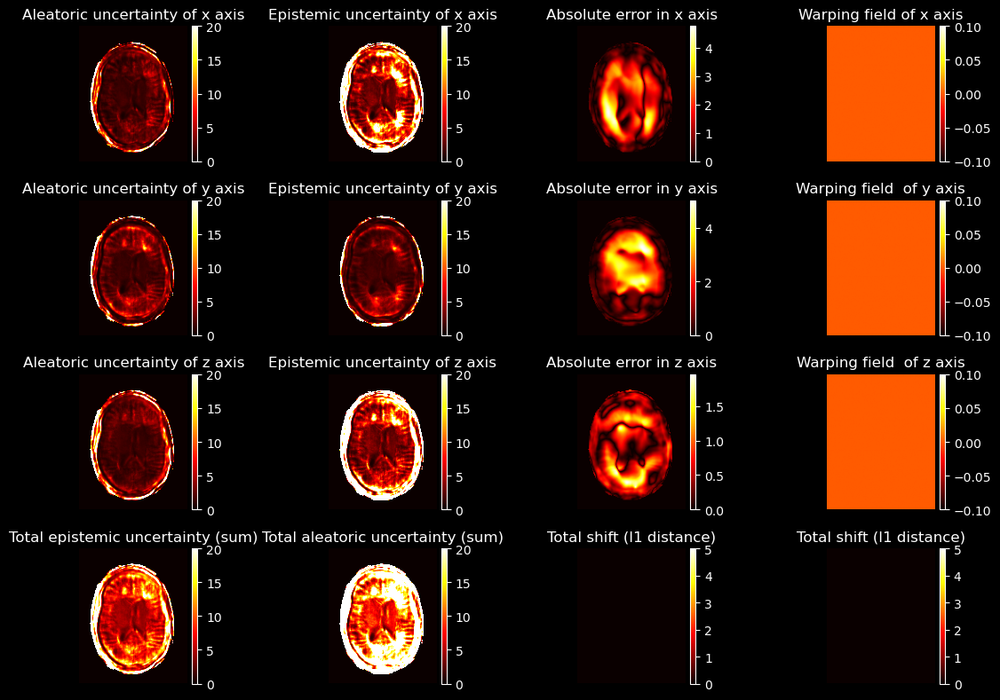

  5%|▌         | 1/20 [00:11<03:30, 11.09s/it]

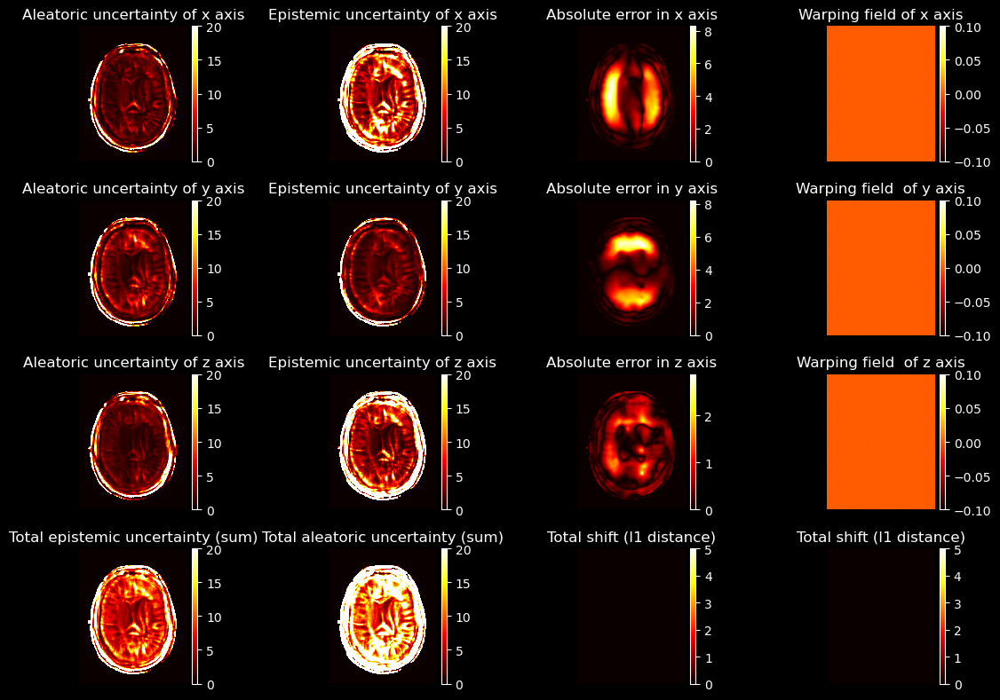

 10%|█         | 2/20 [00:22<03:24, 11.34s/it]

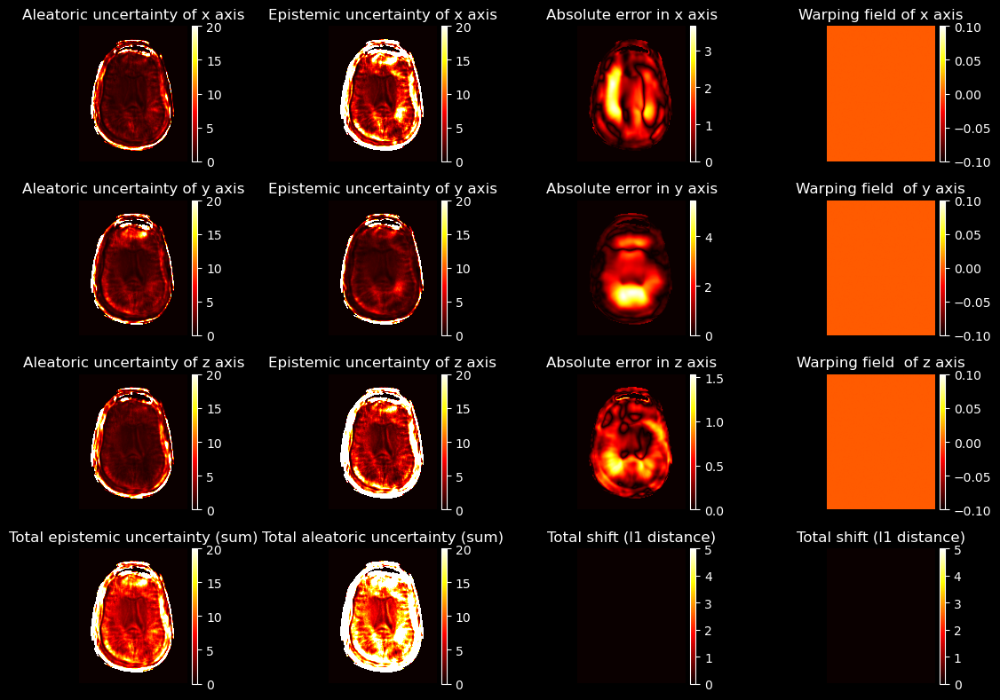

 15%|█▌        | 3/20 [00:33<03:09, 11.13s/it]

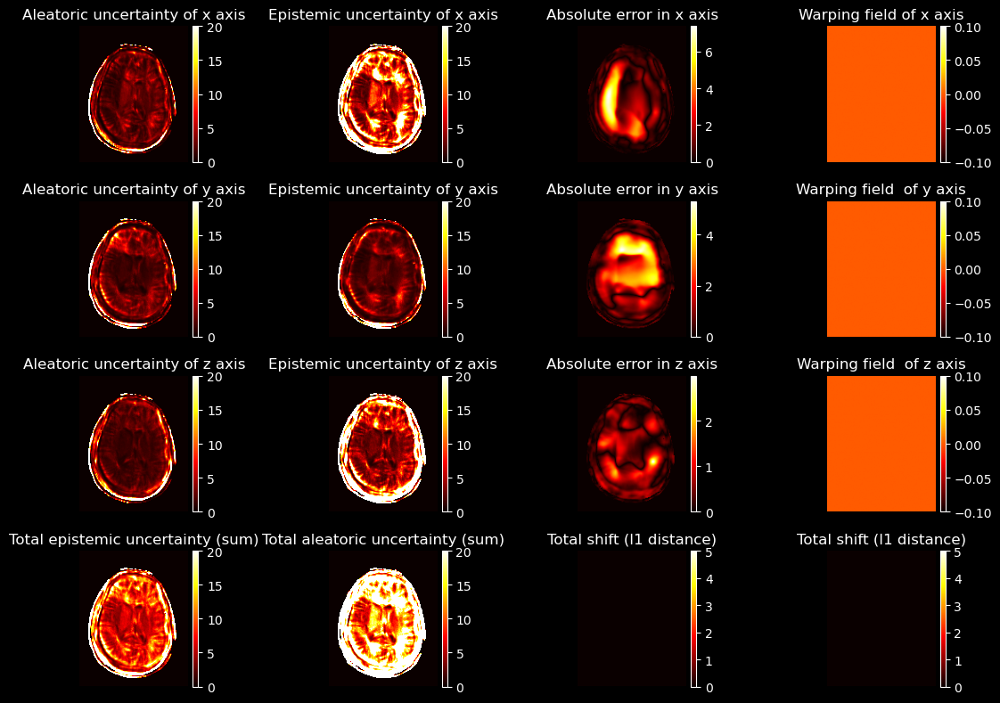

 20%|██        | 4/20 [00:45<03:03, 11.48s/it]

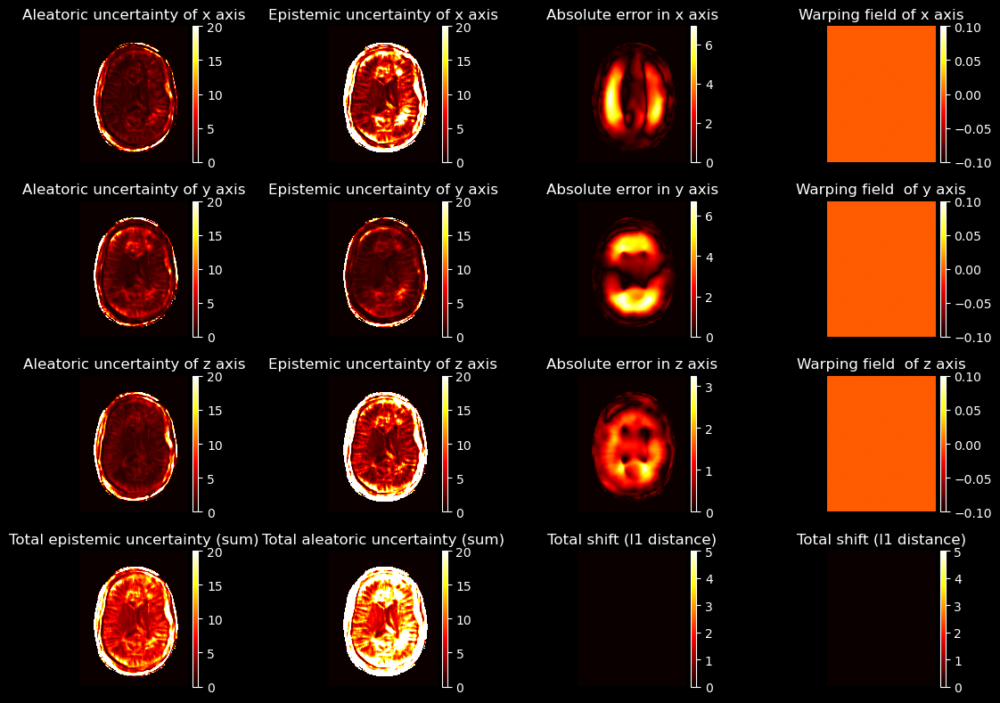

 25%|██▌       | 5/20 [00:57<02:52, 11.50s/it]

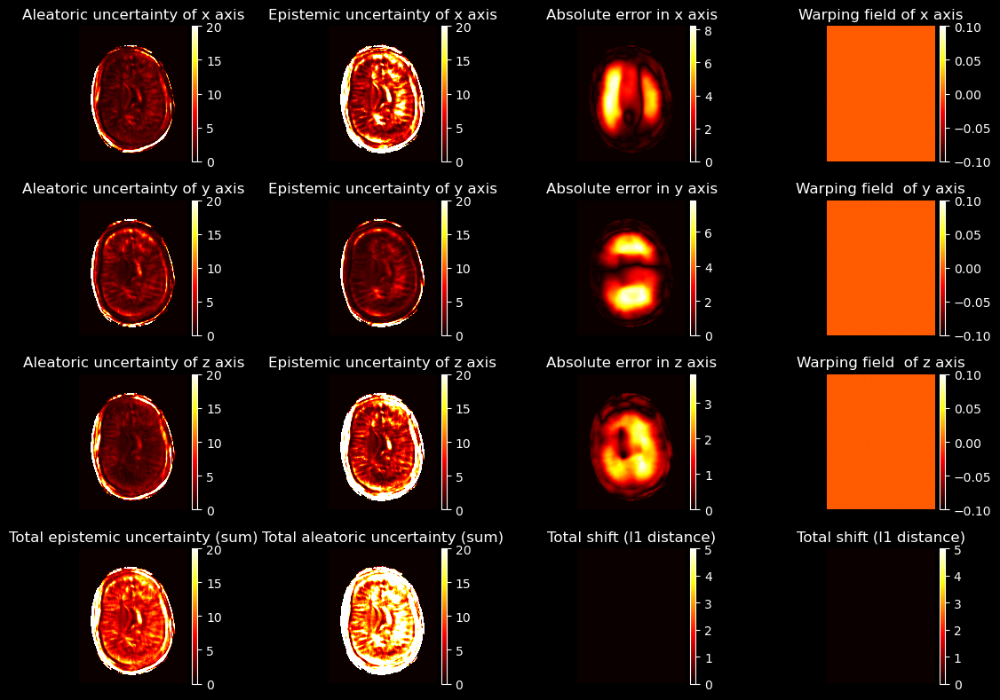

 30%|███       | 6/20 [01:08<02:40, 11.43s/it]

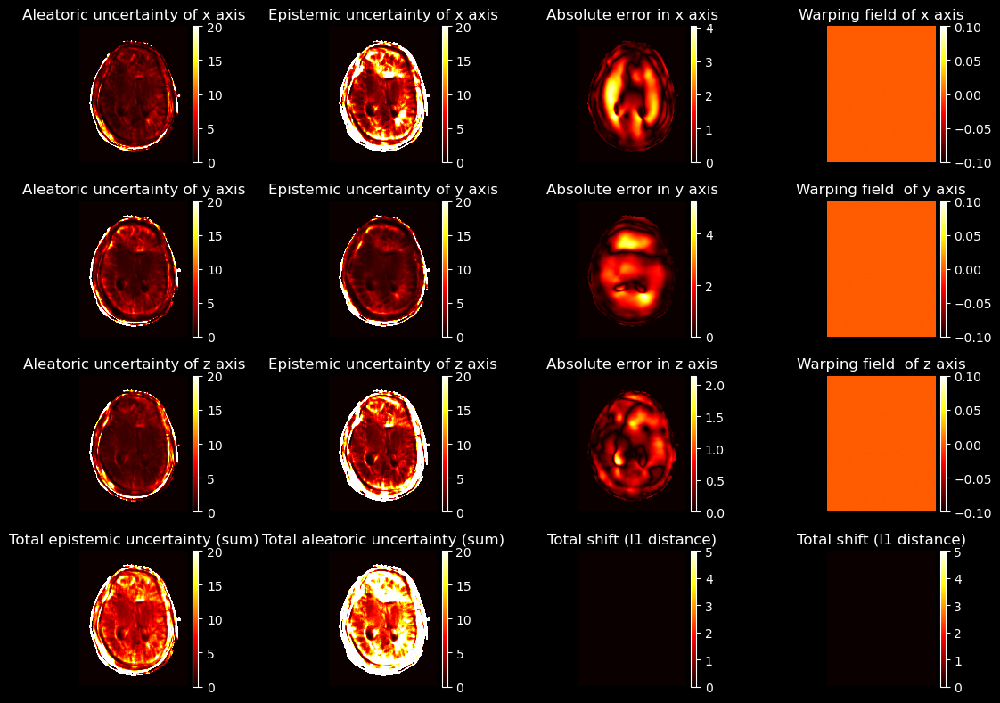

 35%|███▌      | 7/20 [01:19<02:28, 11.39s/it]

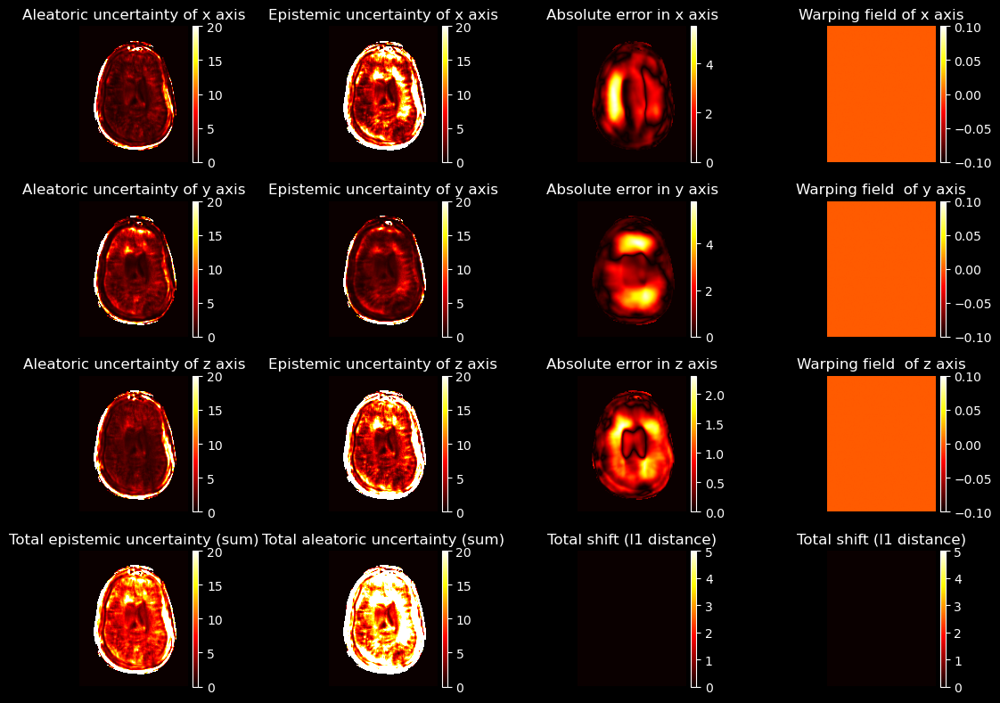

 40%|████      | 8/20 [01:30<02:15, 11.31s/it]

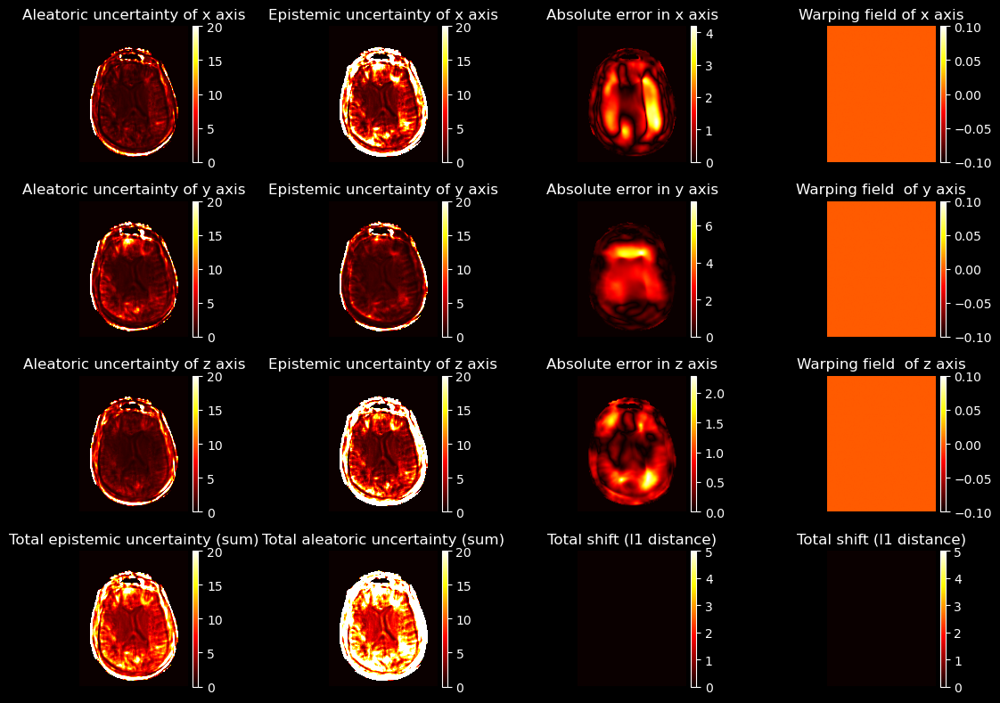

 45%|████▌     | 9/20 [01:42<02:04, 11.29s/it]

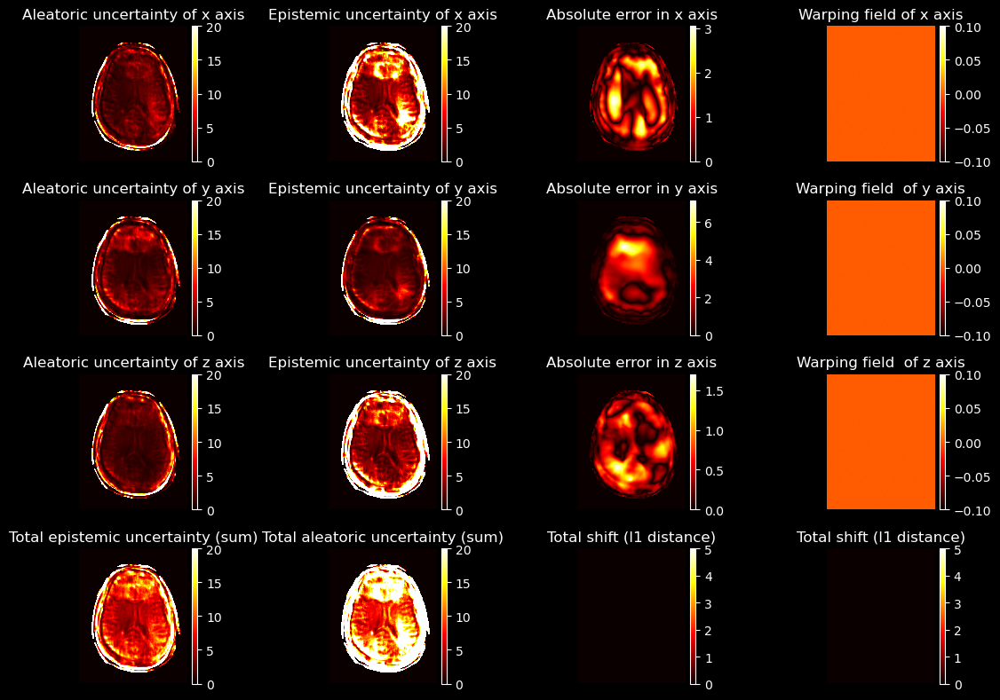

 50%|█████     | 10/20 [01:53<01:52, 11.29s/it]

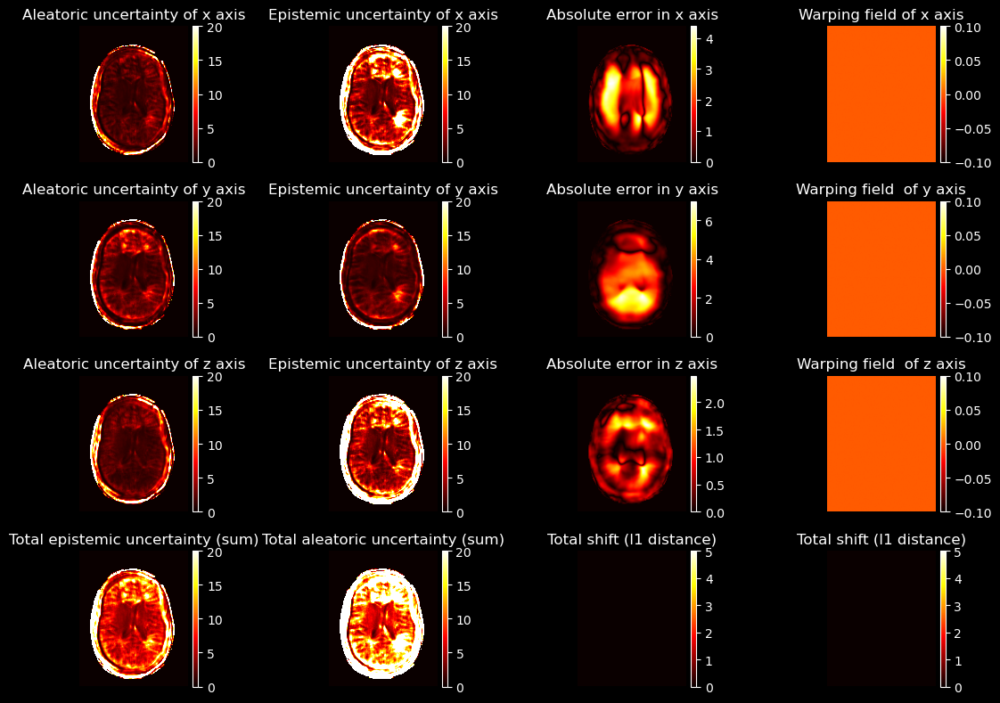

 55%|█████▌    | 11/20 [02:04<01:41, 11.30s/it]

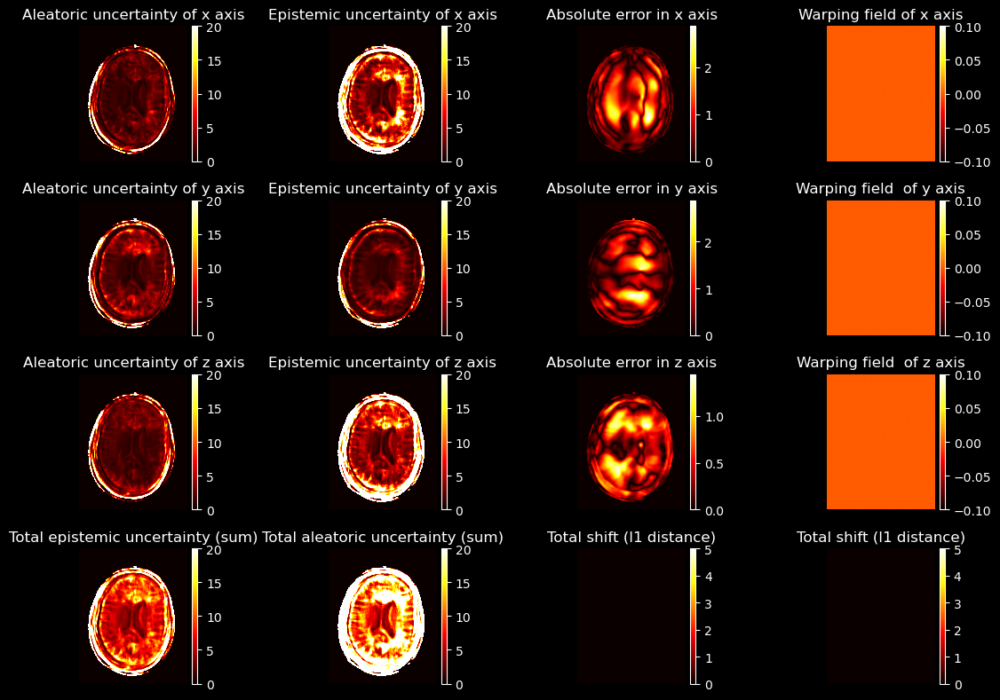

 60%|██████    | 12/20 [02:16<01:31, 11.50s/it]

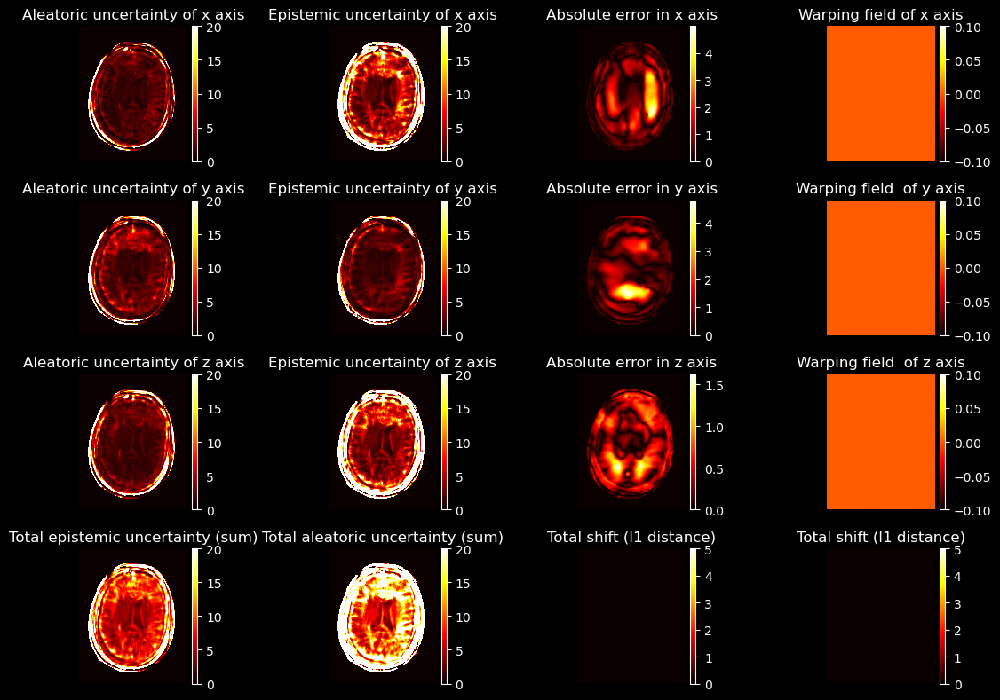

 65%|██████▌   | 13/20 [02:27<01:19, 11.37s/it]

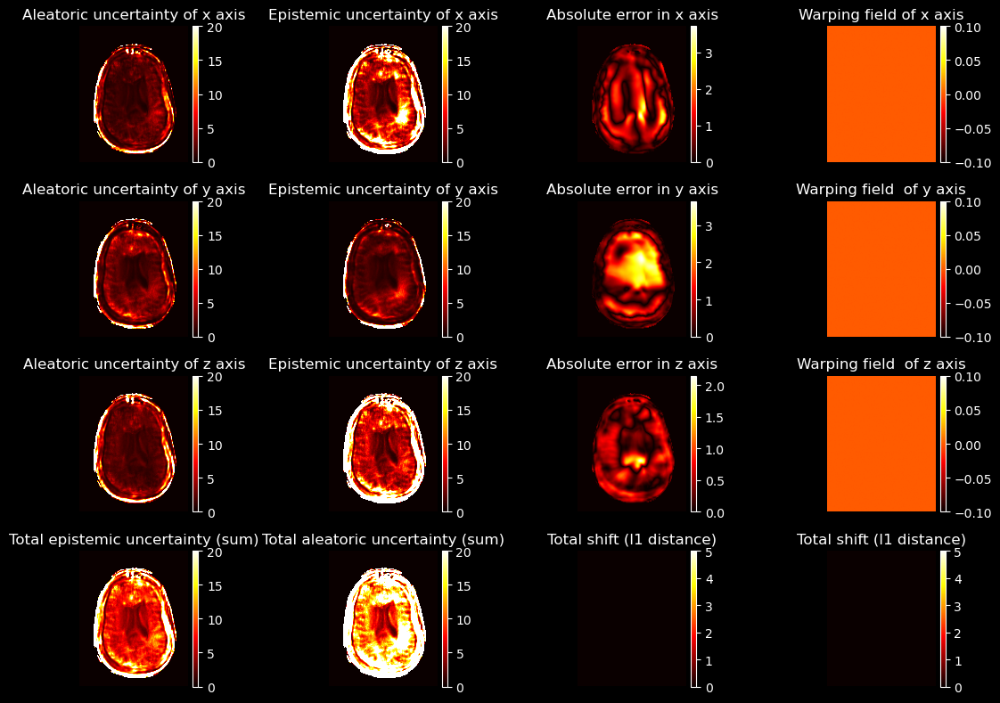

 70%|███████   | 14/20 [02:39<01:08, 11.38s/it]

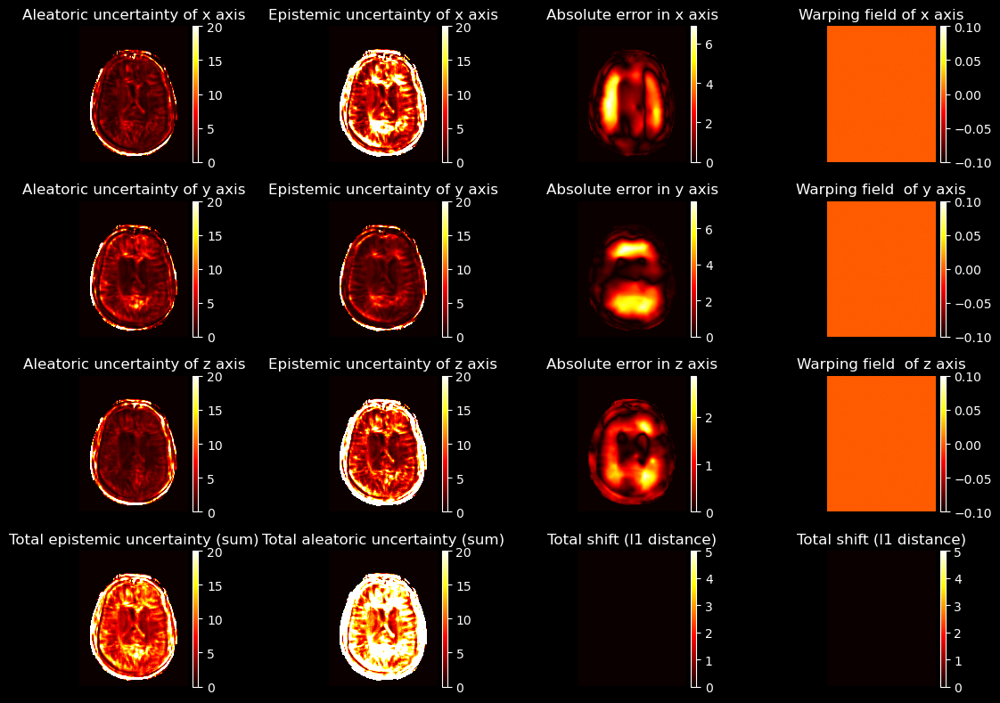

 75%|███████▌  | 15/20 [02:50<00:56, 11.37s/it]

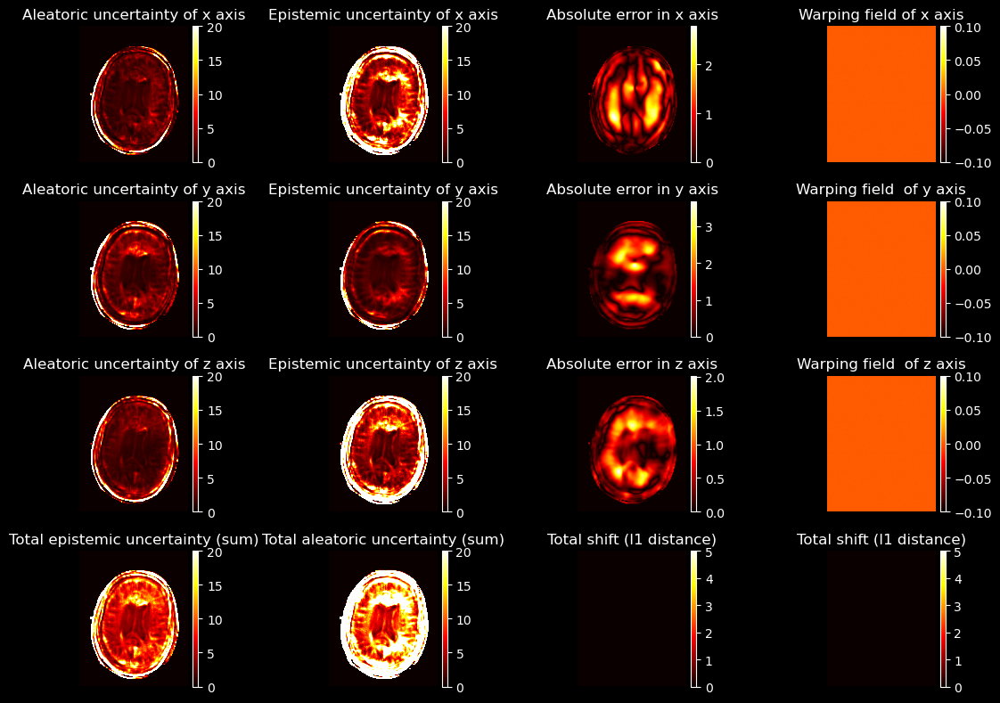

 80%|████████  | 16/20 [03:01<00:45, 11.35s/it]

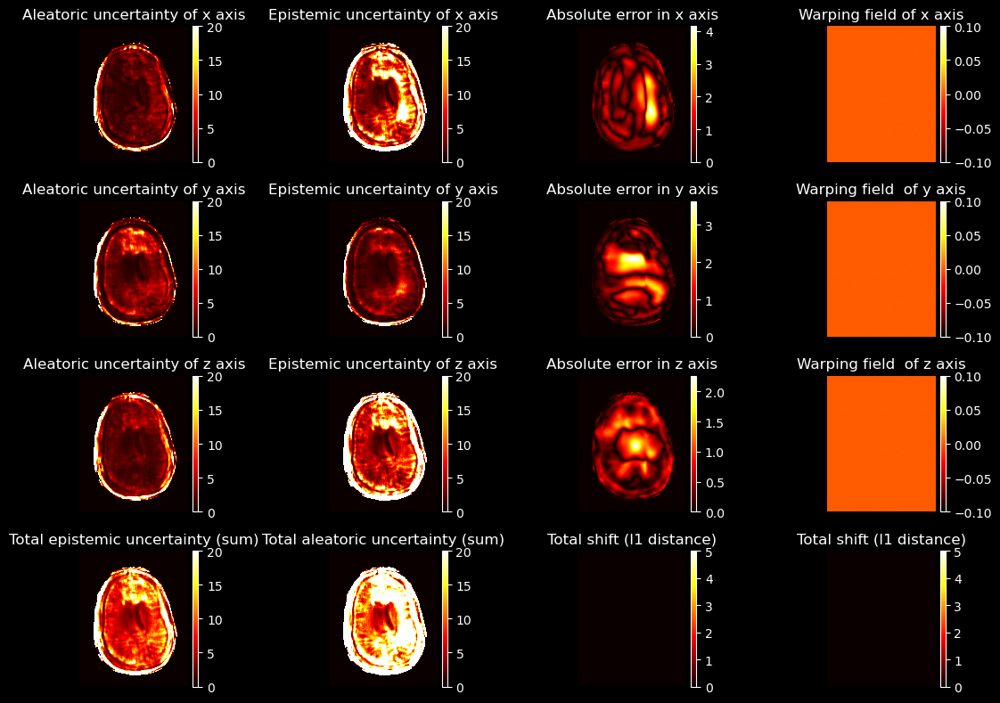

 85%|████████▌ | 17/20 [03:12<00:33, 11.24s/it]

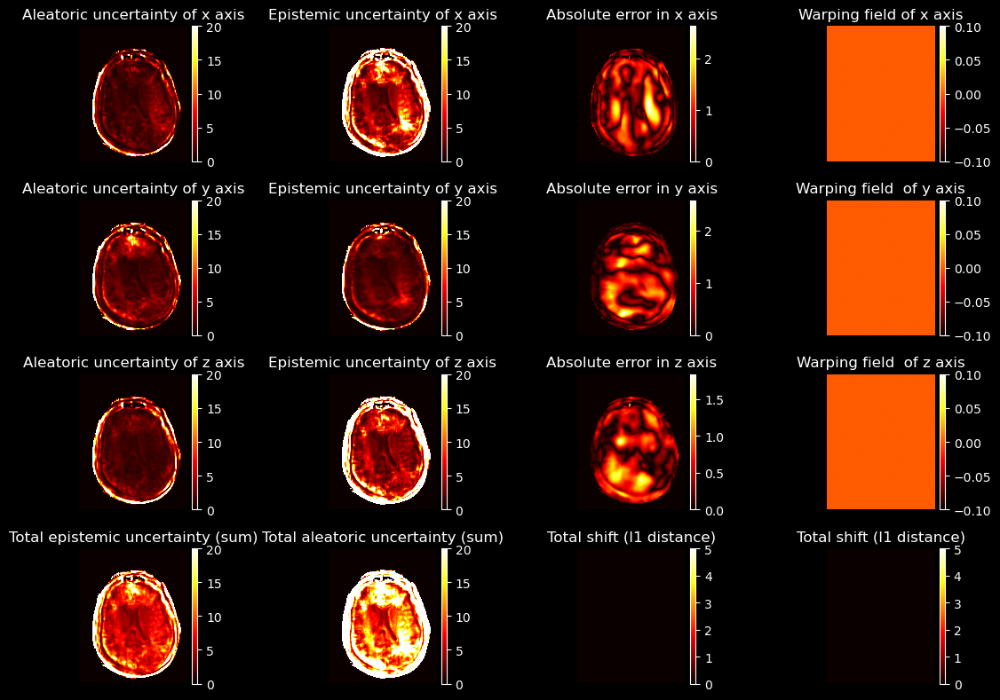

 90%|█████████ | 18/20 [03:23<00:22, 11.24s/it]

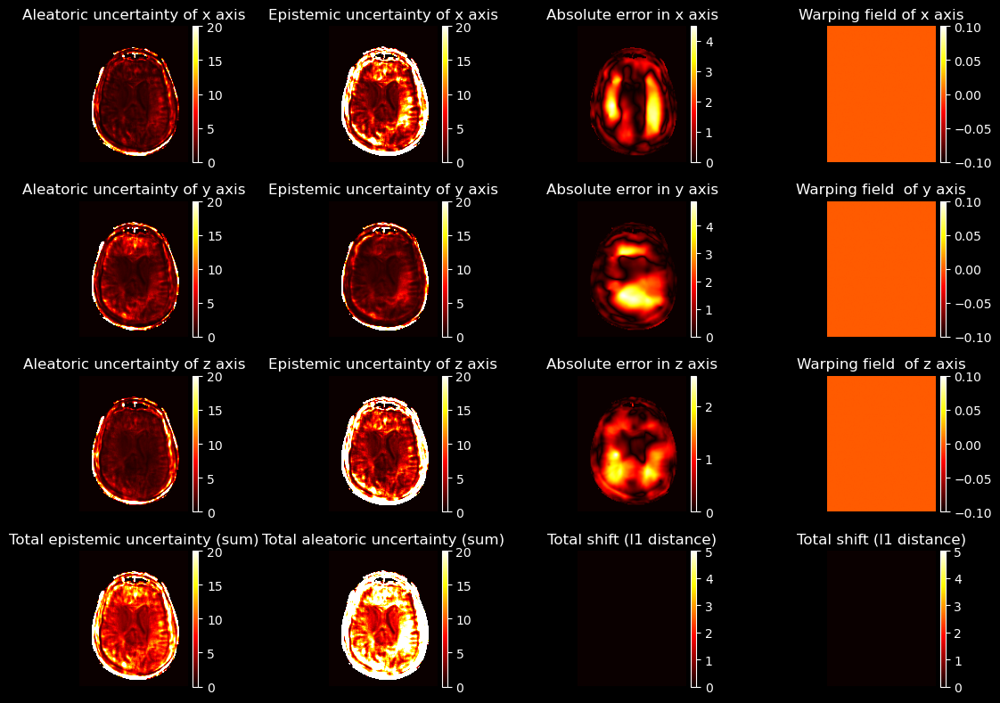

 95%|█████████▌| 19/20 [03:34<00:11, 11.16s/it]

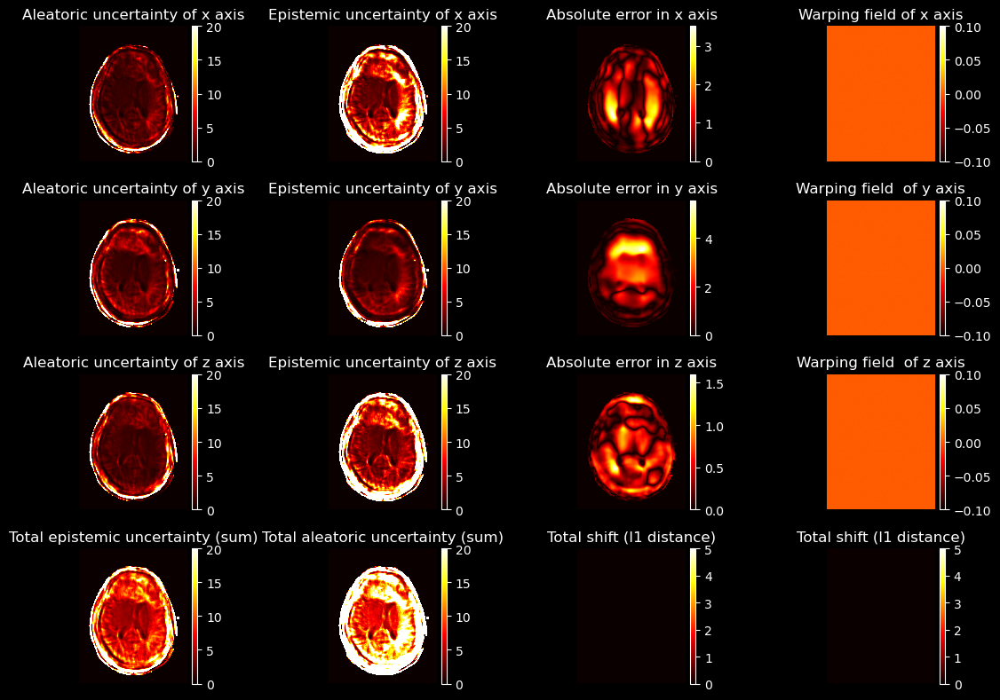

100%|██████████| 20/20 [03:46<00:00, 11.31s/it]


In [25]:
for i in tqdm(range(20)):
    data = valid_dataset[i]
    # cbct_fixed = torch.from_numpy(data[0]).to(device).unsqueeze(0).unsqueeze(0).to(device)
    # mr_moving = torch.from_numpy(data[1]).to(device).unsqueeze(0).unsqueeze(0).to(device)
    # ct_fixed = torch.from_numpy(data[2]).unsqueeze(0).unsqueeze(0).to(device)
    # ct_moving = torch.from_numpy(data[3]).unsqueeze(0).unsqueeze(0).to(device)
    #mr_gt = data[6].to(device)
    cbct_fixed = data[0].to(device).to(device)
    mr_moving = data[1].to(device).to(device)
    ct_fixed = data[2].to(device)
    ct_moving = data[3].to(device)
    gt = torch.from_numpy(data[-1]).to(device)
    # print(cbct_fixed.shape,mr_moving.shape,ct_fixed.shape,ct_moving.shape,gt.shape)
    with torch.no_grad():
#         _, ct_moving_synth, ct_fixed_synth = G(mr_moving, cbct_fixed)
        flows,_, _ = G(mr_moving, cbct_fixed)
        mr_reg = vxm.layers.SpatialTransformer([128,160,128], mode='bilinear').to(device)(mr_moving, flows[0])
        uncert = flows[4]
        alpha_x = uncert[0,0,:,:,:]+1
        beta_x = uncert[0,1,:,:,:]
        mu_x = uncert[0,2,:,:,:]
        omega_x = 2*beta_x*(1+mu_x)
        alpha_y = uncert[0,3,:,:,:]+1
        beta_y = uncert[0,4,:,:,:]
        mu_y = uncert[0,5,:,:,:]
        omega_y = 2*beta_y*(1+mu_y)
        alpha_z = uncert[0,6,:,:,:]+1
        beta_z = uncert[0,7,:,:,:]
        mu_z = uncert[0,8,:,:,:]
        omega_z = 2*beta_z*(1+mu_z)    
    alea_x = beta_x/(alpha_x-1+1e-6)
    alea_y = beta_y/(alpha_y-1+1e-6)
    alea_z = beta_z/(alpha_z-1+1e-6)

    epi_x = beta_x/(mu_x*(alpha_x-1)+1e-6)
    epi_y = beta_y/(mu_y*(alpha_y-1)+1e-6)
    epi_z = beta_z/(mu_z*(alpha_z-1)+1e-6)

    #max_alea = np.percentile(np.concatenate((alea_x,alea_y,alea_z)),99)
    #max_epi = np.percentile(np.concatenate((epi_x,epi_y,epi_z)),99)
    plt.style.use('dark_background')
    islice = 72
    mask_head = (cbct_fixed[0,0,:,:,islice].cpu().numpy()>0.05).astype(int)
    fig, ax = plt.subplots(4,4,figsize=(12,8))
    np.vectorize(lambda ax: ax.axis('off'))(ax)
    # ax[0][0].imshow(cbct_fixed.cpu().numpy()[0,0,:,:,islice].T, cmap='gray')
    # ax[0][0].set_title('Input CBCT')
    # ax[0][1].imshow(mr_moving.cpu().numpy()[0,0,:,:,islice].T, cmap='gray')
    # ax[0][1].set_title('Input MRI')
    # ax[0][2].imshow(mr_reg.squeeze().cpu().numpy()[:,:,islice].T, cmap='gray')
    # ax[0][2].set_title('Registered MRI')
    # ax[3].imshow(mr_gt.cpu().numpy()[0,0,:,:,islice].T, cmap='gray')
    # error = mr_moving.squeeze().cpu().numpy()[:,:,islice].T - mr_gt.cpu().numpy()[0,0,:,:,islice].T
    # imx1 = ax[0][0].imshow((np.flip(alea_x.cpu().numpy()[islice,:,:]*mask_head).T), cmap='hot', vmin=0, vmax = 30)
    # divider = make_axes_locatable(ax[0][0])
    # cax = divider.append_axes('right', size='5%', pad=0.05)
    # fig.colorbar(imx1, cax=cax, orientation='vertical')
    # ax[0][0].set_title('Aleatoric uncertainty of x axis')
    # imy1 = ax[1][0].imshow((np.flip(alea_y.cpu().numpy()[islice,:,:]*mask_head).T), cmap='hot', vmin=0, vmax = 30)
    # divider = make_axes_locatable(ax[1][0])
    # cax = divider.append_axes('right', size='5%', pad=0.05)
    # fig.colorbar(imy1, cax=cax, orientation='vertical')
    # ax[1][0].set_title('Aleatoric uncertainty of y axis')

    # imz1 = ax[2][0].imshow((np.flip(alea_z.cpu().numpy()[islice,:,:]*mask_head).T), cmap='hot', vmin=0, vmax = 30)
    # divider = make_axes_locatable(ax[2][0])
    # cax = divider.append_axes('right', size='5%', pad=0.05)
    # fig.colorbar(imz1, cax=cax, orientation='vertical')
    # ax[2][0].set_title('Aleatoric uncertainty of z axis')

    # imx2 = ax[0][1].imshow((np.flip(epi_x.cpu().numpy()[islice,:,:]*mask_head).T), cmap='hot', vmin=0, vmax = 30)
    # divider = make_axes_locatable(ax[0][1])
    # cax = divider.append_axes('right', size='5%', pad=0.05)
    # fig.colorbar(imx2, cax=cax, orientation='vertical')
    # ax[0][1].set_title('Epistemic uncertainty of x axis')
    # imy2 = ax[1][1].imshow((np.flip(epi_y.cpu().numpy()[islice,:,:]*mask_head).T), cmap='hot', vmin=0, vmax = 30)
    # divider = make_axes_locatable(ax[1][1])
    # cax = divider.append_axes('right', size='5%', pad=0.05)
    # fig.colorbar(imy2, cax=cax, orientation='vertical')
    # ax[1][1].set_title('Epistemic uncertainty of y axis')
    # imz2 = ax[2][1].imshow((np.flip(epi_z.cpu().numpy()[islice,:,:]*mask_head).T), cmap='hot', vmin=0, vmax = 30)
    # divider = make_axes_locatable(ax[2][1])
    # cax = divider.append_axes('right', size='5%', pad=0.05)
    # fig.colorbar(imz2, cax=cax, orientation='vertical')
    # ax[2][1].set_title('Epistemic uncertainty of z axis')
    # plt.tight_layout()
    # plt.show()
    alx = (alea_x.cpu().numpy()[:,:,islice]*mask_head).T
    aly = (alea_y.cpu().numpy()[:,:,islice]*mask_head).T
    alz = (alea_z.cpu().numpy()[:,:,islice]*mask_head).T
    
    ex = (epi_x.cpu().numpy()[:,:,islice]*mask_head).T
    ey = (epi_y.cpu().numpy()[:,:,islice]*mask_head).T
    ez = (epi_z.cpu().numpy()[:,:,islice]*mask_head).T
    
    imx1 = ax[0][0].imshow(alx, cmap='hot', vmin=0,vmax = 20)
    divider = make_axes_locatable(ax[0][0])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imx1, cax=cax, orientation='vertical')
    ax[0][0].set_title('Aleatoric uncertainty of x axis')
    imy1 = ax[1][0].imshow(aly, cmap='hot', vmin=0,vmax = 20)
    divider = make_axes_locatable(ax[1][0])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imy1, cax=cax, orientation='vertical')
    ax[1][0].set_title('Aleatoric uncertainty of y axis')

    imz1 = ax[2][0].imshow(alz, cmap='hot', vmin=0,vmax = 20)
    divider = make_axes_locatable(ax[2][0])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imz1, cax=cax, orientation='vertical')
    ax[2][0].set_title('Aleatoric uncertainty of z axis')

    imx2 = ax[0][1].imshow(ex, cmap='hot', vmin=0,vmax = 20)
    divider = make_axes_locatable(ax[0][1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imx2, cax=cax, orientation='vertical')
    ax[0][1].set_title('Epistemic uncertainty of x axis')
    imy2 = ax[1][1].imshow(ey, cmap='hot', vmin=0,vmax = 20)
    divider = make_axes_locatable(ax[1][1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imy2, cax=cax, orientation='vertical')

    ax[1][1].set_title('Epistemic uncertainty of y axis')
    imz2 = ax[2][1].imshow(ez, cmap='hot', vmin=0,vmax = 20)
    divider = make_axes_locatable(ax[2][1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imz2, cax=cax, orientation='vertical')
    ax[2][1].set_title('Epistemic uncertainty of z axis')
    
    imta =  ax[3][0].imshow(alx+aly+alz, cmap='hot', vmin=0,vmax = 20)
    divider = make_axes_locatable(ax[3][0])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imta, cax=cax, orientation='vertical')
    ax[3][0].set_title('Total epistemic uncertainty (sum)')
    imte =  ax[3][1].imshow(ex+ey+ez, cmap='hot', vmin=0,vmax = 20)
    divider = make_axes_locatable(ax[3][1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imte, cax=cax, orientation='vertical')
    ax[3][1].set_title('Total aleatoric uncertainty (sum)')
        
    # imx2 = ax[0][2].imshow((flows[0][0,0,:,:,islice]*mask_head).T, cmap='hot', vmin=0, vmax = 5)
    # divider = make_axes_locatable(ax[0][2])
    # cax = divider.append_axes('right', size='5%', pad=0.05)
    # fig.colorbar(imx2, cax=cax, orientation='vertical')
    # ax[0][2].set_title('Warping field of x axis')
    # imy2 = ax[1][2].imshow((flows[0][0,1,:,:,islice]*mask_head).T, cmap='hot', vmin=0, vmax = 5)
    # divider = make_axes_locatable(ax[1][2])
    # cax = divider.append_axes('right', size='5%', pad=0.05)
    # fig.colorbar(imy2, cax=cax, orientation='vertical')
    # ax[1][2].set_title('Warping field  of y axis')
    # imz2 = ax[2][2].imshow((flows[0][0,2,:,:,islice]*mask_head).T, cmap='hot', vmin=0, vmax = 5)
    # divider = make_axes_locatable(ax[2][2])
    # cax = divider.append_axes('right', size='5%', pad=0.05)
    # fig.colorbar(imz2, cax=cax, orientation='vertical')
    # ax[2][2].set_title('Warping field  of z axis')
    # imz2 = ax[3][2].imshow(((flows[0][0,0,:,:,islice]+flows[0][0,1,:,:,islice]+flows[0][0,2,:,:,islice])*mask_head).T, cmap='hot', vmin=0, vmax = 5)
    # divider = make_axes_locatable(ax[3][2])
    # cax = divider.append_axes('right', size='5%', pad=0.05)
    # fig.colorbar(imz2, cax=cax, orientation='vertical')
    # ax[3][2].set_title('Total shift (l1 distance)')
    # imx2 = ax[0][2].imshow((var[i][0,0,:,:,islice]*mask_head).T, cmap='hot', vmin=0, vmax = 1)
    # divider = make_axes_locatable(ax[0][2])
    # cax = divider.append_axes('right', size='5%', pad=0.05)
    # fig.colorbar(imx2, cax=cax, orientation='vertical')
    # ax[0][2].set_title('Warping field of x axis')
    # imy2 = ax[1][2].imshow((var[i][0,1,:,:,islice]*mask_head).T, cmap='hot', vmin=0, vmax = 1)
    # divider = make_axes_locatable(ax[1][2])
    # cax = divider.append_axes('right', size='5%', pad=0.05)
    # fig.colorbar(imy2, cax=cax, orientation='vertical')
    # ax[1][2].set_title('Warping field  of y axis')
    # imz2 = ax[2][2].imshow((var[i][0,2,:,:,islice]*mask_head).T, cmap='hot', vmin=0, vmax = 1)
    # divider = make_axes_locatable(ax[2][2])
    # cax = divider.append_axes('right', size='5%', pad=0.05)
    # fig.colorbar(imz2, cax=cax, orientation='vertical')
    # ax[2][2].set_title('Warping field  of z axis')
    # imz2 = ax[3][2].imshow(((var[i][0,0,:,:,islice]+var[i][0,1,:,:,islice]+var[i][0,2,:,:,islice])*mask_head).T, cmap='hot', vmin=0, vmax = 5)
    # divider = make_axes_locatable(ax[3][2])
    # cax = divider.append_axes('right', size='5%', pad=0.05)
    # fig.colorbar(imz2, cax=cax, orientation='vertical')
    # ax[3][2].set_title('Total shift (l1 distance)')
    imx2 = ax[0][2].imshow(abs(((flows[0][0,0,:,:,islice]+gt[0,0,:,:,islice])*mask_head)).T, cmap='hot')
    divider = make_axes_locatable(ax[0][2])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imx2, cax=cax, orientation='vertical')
    ax[0][2].set_title('Absolute error in x axis')
    imy2 = ax[1][2].imshow(abs(((flows[0][0,1,:,:,islice]+gt[0,1,:,:,islice])*mask_head)).T, cmap='hot')
    divider = make_axes_locatable(ax[1][2])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imy2, cax=cax, orientation='vertical')
    ax[1][2].set_title('Absolute error in y axis')
    imz2 = ax[2][2].imshow(abs(((flows[0][0,2,:,:,islice]+gt[0,2,:,:,islice])*mask_head)).T, cmap='hot')
    divider = make_axes_locatable(ax[2][2])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imz2, cax=cax, orientation='vertical')
    ax[2][2].set_title('Absolute error in z axis')
    imz2 = ax[3][2].imshow(((var[i][0,0,:,:,islice]+var[i][0,1,:,:,islice]+var[i][0,2,:,:,islice])*mask_head).T, cmap='hot', vmin=0, vmax = 5)
    divider = make_axes_locatable(ax[3][2])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imz2, cax=cax, orientation='vertical')
    ax[3][2].set_title('Total shift (l1 distance)')
    
    imx2 = ax[0][3].imshow(((var[i][0,0,:,:,islice]*mask_head).T), cmap='hot', vmin=0)
    divider = make_axes_locatable(ax[0][3])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imx2, cax=cax, orientation='vertical')
    ax[0][3].set_title('Warping field of x axis')
    imy2 = ax[1][3].imshow(((var[i][0,1,:,:,islice]*mask_head).T), cmap='hot', vmin=0)
    divider = make_axes_locatable(ax[1][3])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imy2, cax=cax, orientation='vertical')
    ax[1][3].set_title('Warping field  of y axis')
    imz2 = ax[2][3].imshow(((var[i][0,2,:,:,islice]*mask_head).T), cmap='hot', vmin=0)
    divider = make_axes_locatable(ax[2][3])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imz2, cax=cax, orientation='vertical')
    ax[2][3].set_title('Warping field  of z axis')
    imz2 = ax[3][3].imshow(((var[i][0,0,:,:,islice]+var[i][0,1,:,:,islice]+var[i][0,2,:,:,islice])*mask_head).T, cmap='hot', vmin=0, vmax = 5)
    divider = make_axes_locatable(ax[3][3])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imz2, cax=cax, orientation='vertical')
    ax[3][3].set_title('Total shift (l1 distance)')
    plt.tight_layout()
    plt.show()

  0%|          | 0/20 [00:00<?, ?it/s]

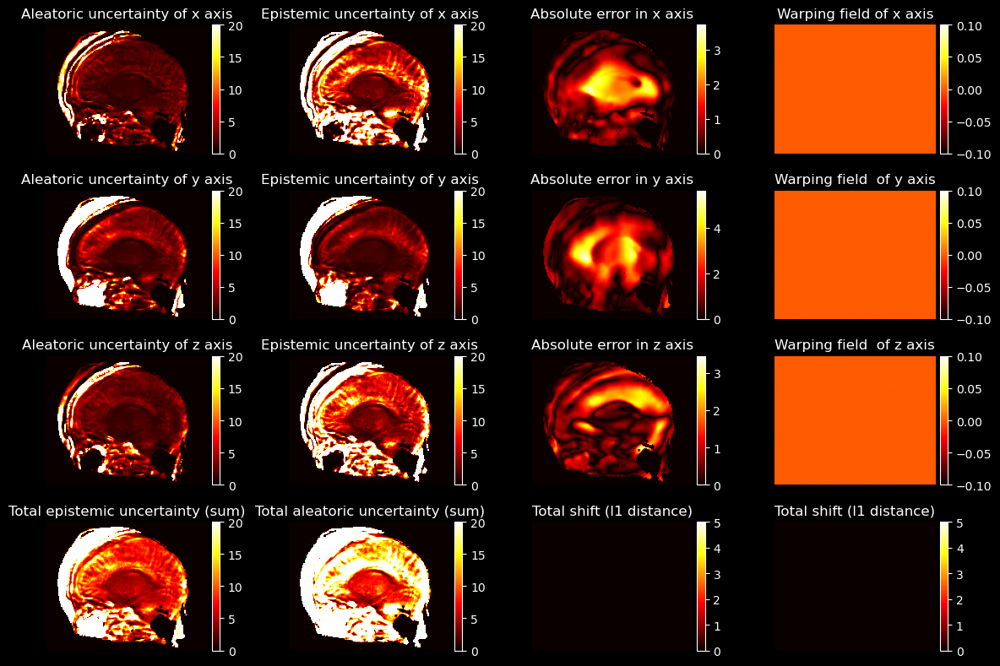

  5%|▌         | 1/20 [00:12<03:58, 12.56s/it]

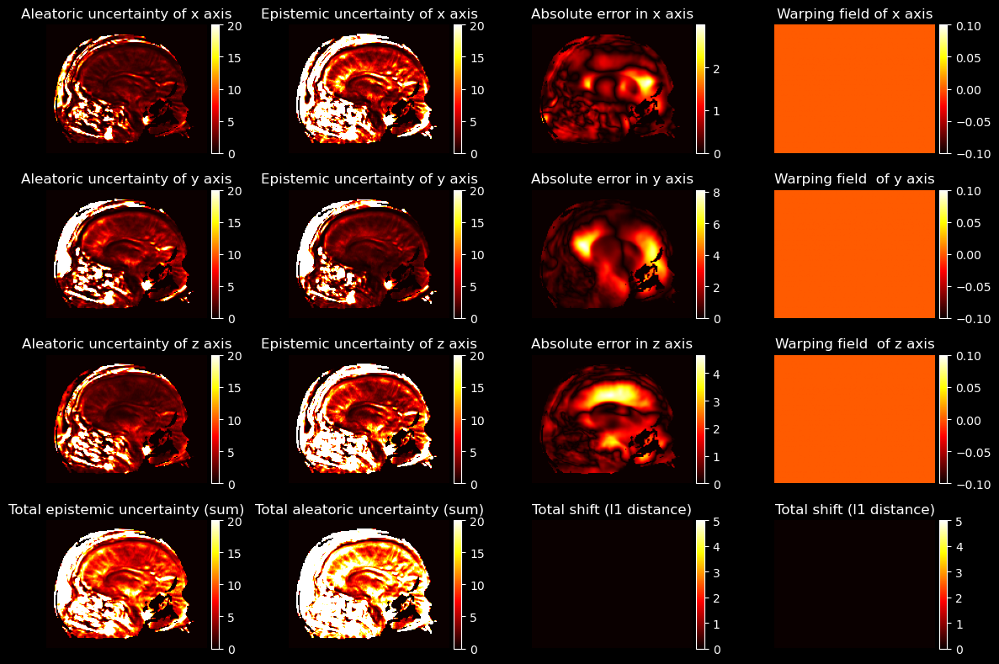

 10%|█         | 2/20 [00:23<03:30, 11.71s/it]

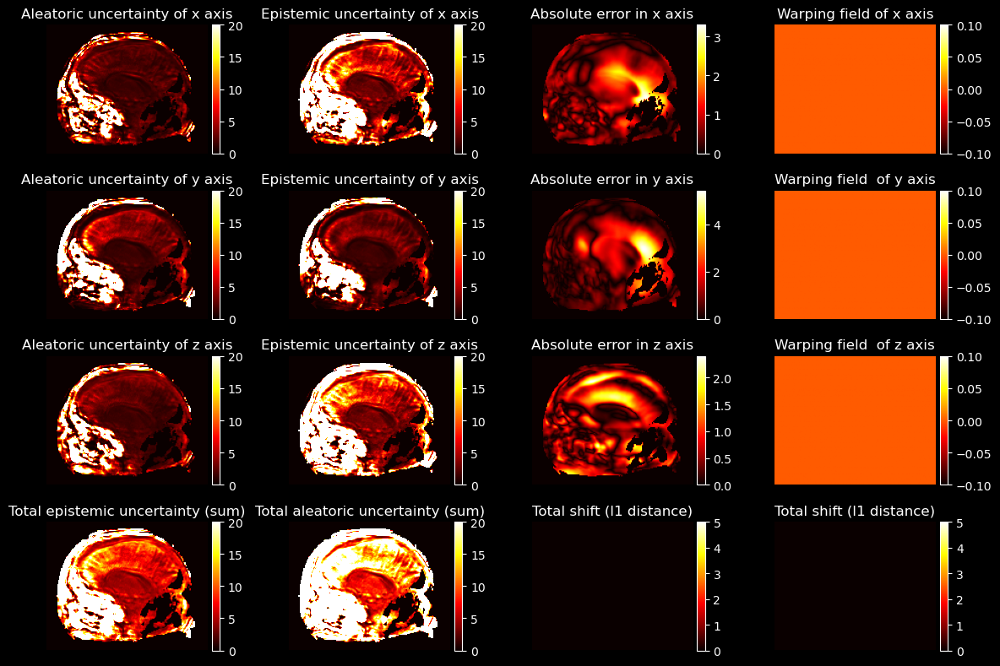

 15%|█▌        | 3/20 [00:35<03:16, 11.54s/it]

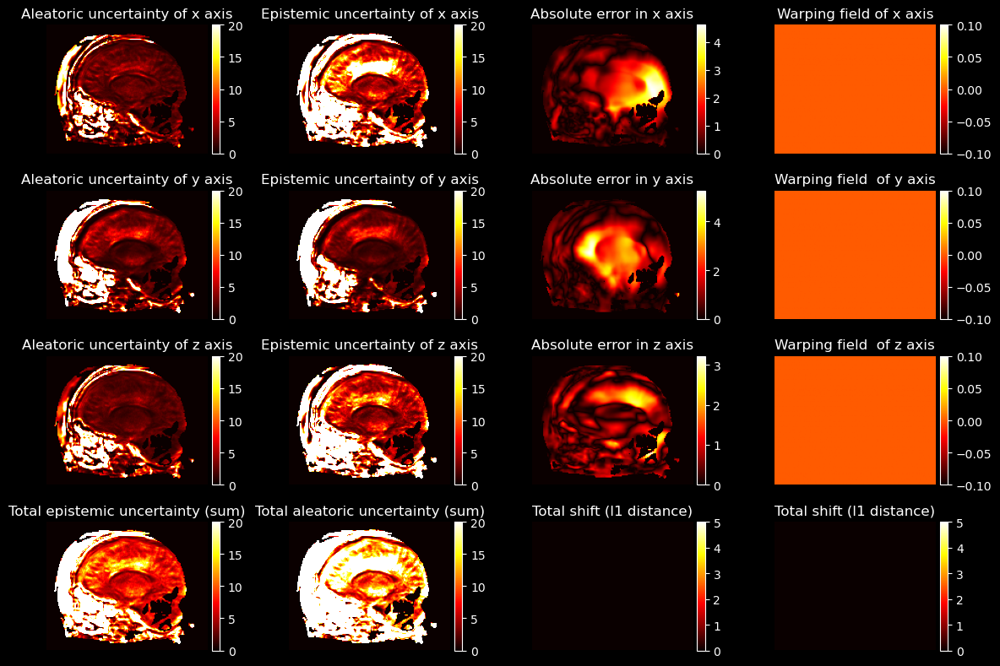

 20%|██        | 4/20 [00:45<03:00, 11.29s/it]

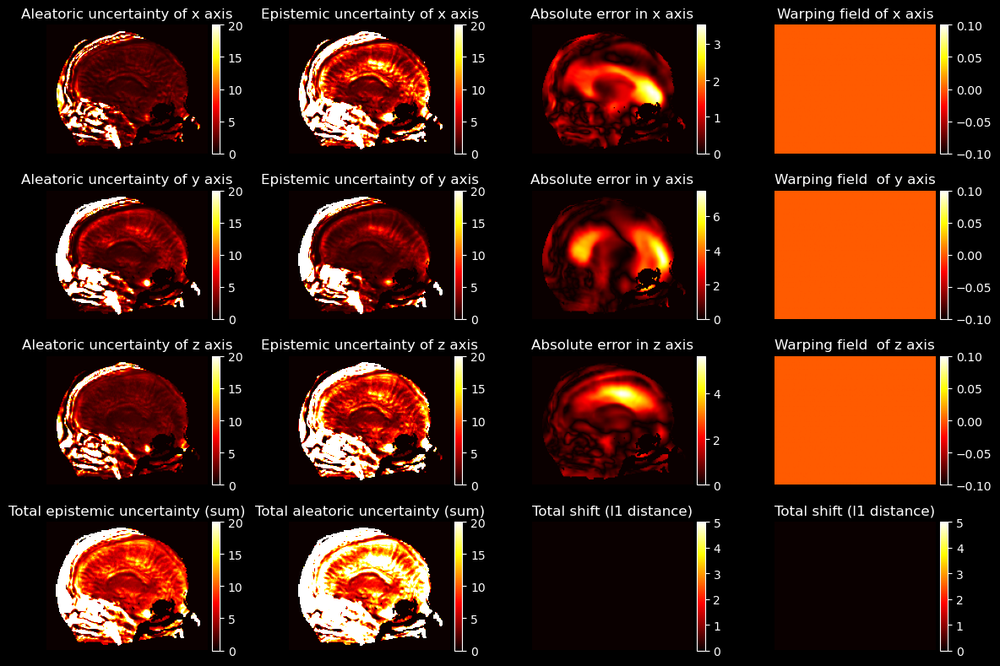

 25%|██▌       | 5/20 [00:57<02:52, 11.48s/it]

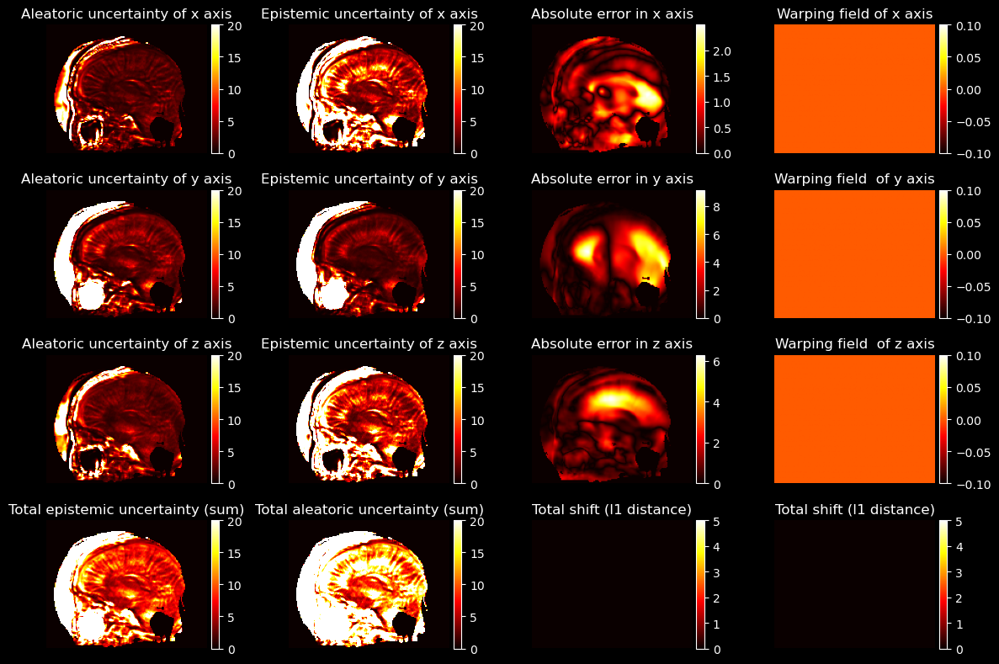

 30%|███       | 6/20 [01:09<02:40, 11.43s/it]

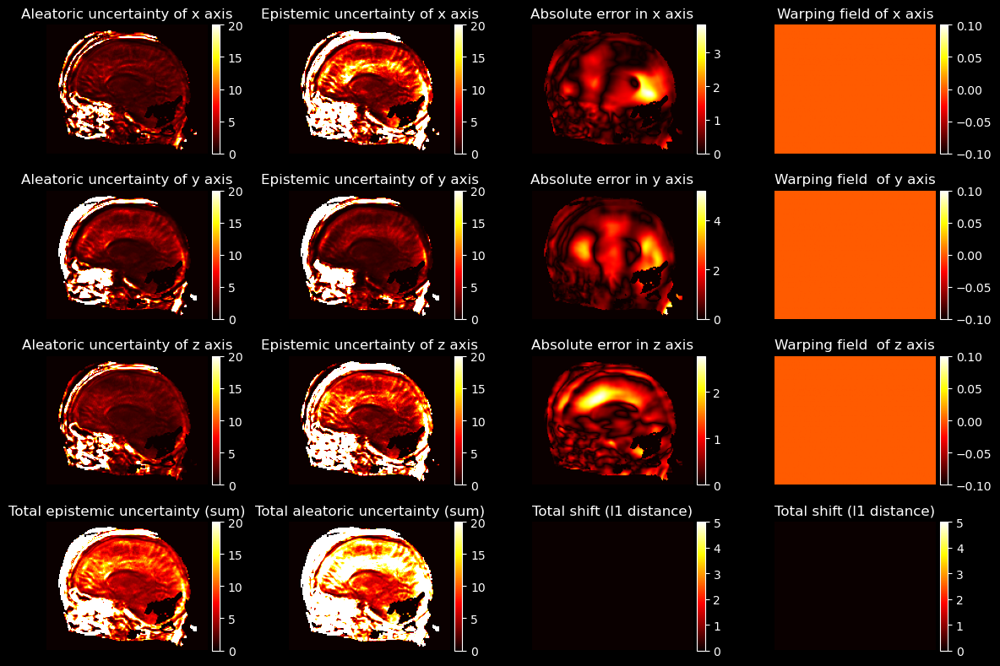

 35%|███▌      | 7/20 [01:21<02:32, 11.70s/it]

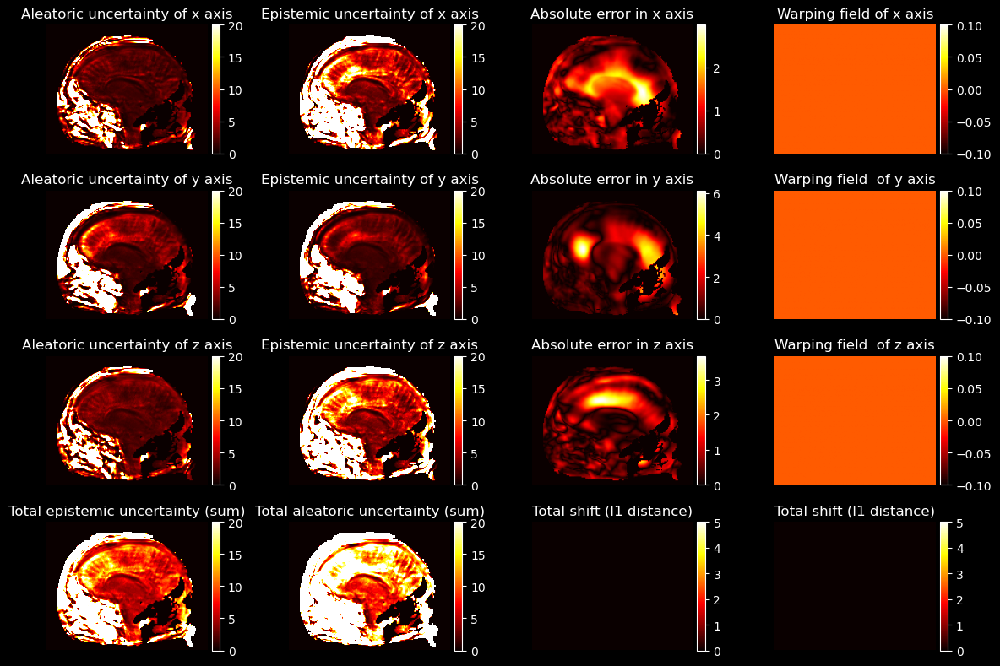

 40%|████      | 8/20 [01:32<02:18, 11.54s/it]

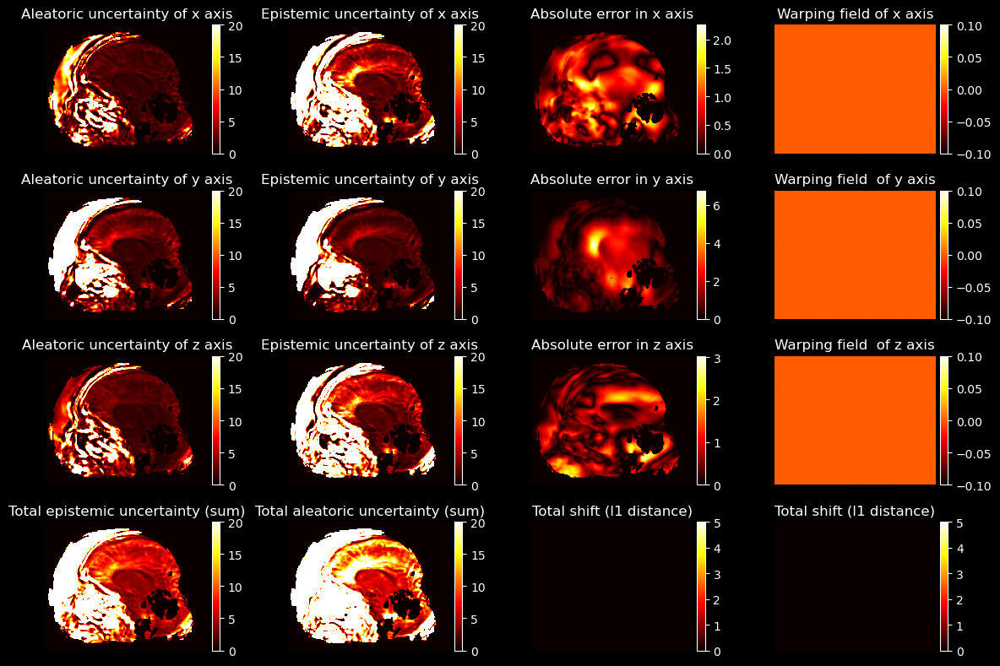

 45%|████▌     | 9/20 [01:44<02:08, 11.64s/it]

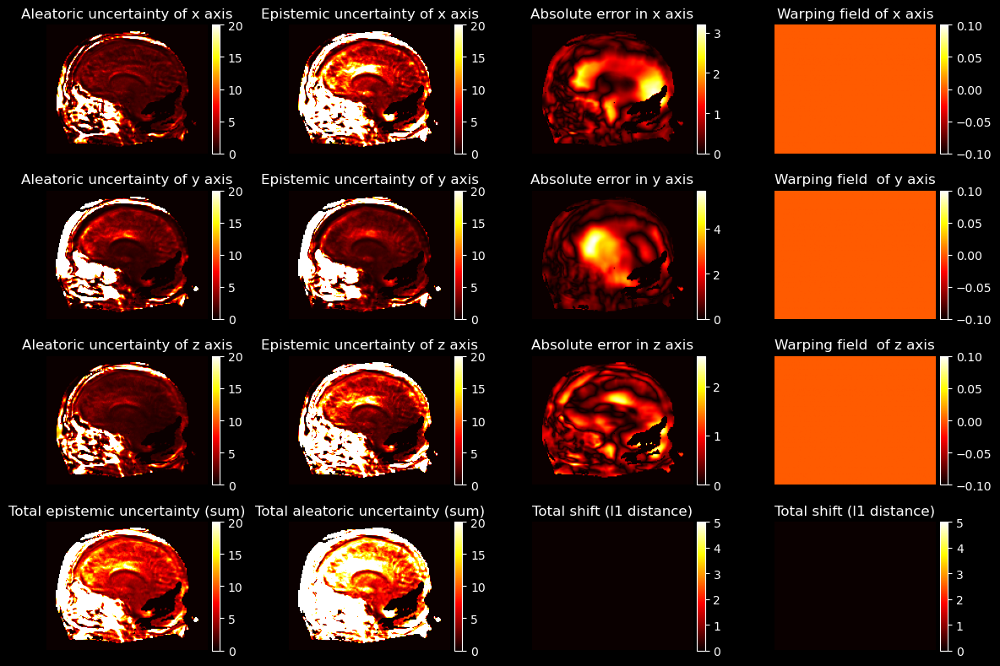

 50%|█████     | 10/20 [01:55<01:55, 11.58s/it]

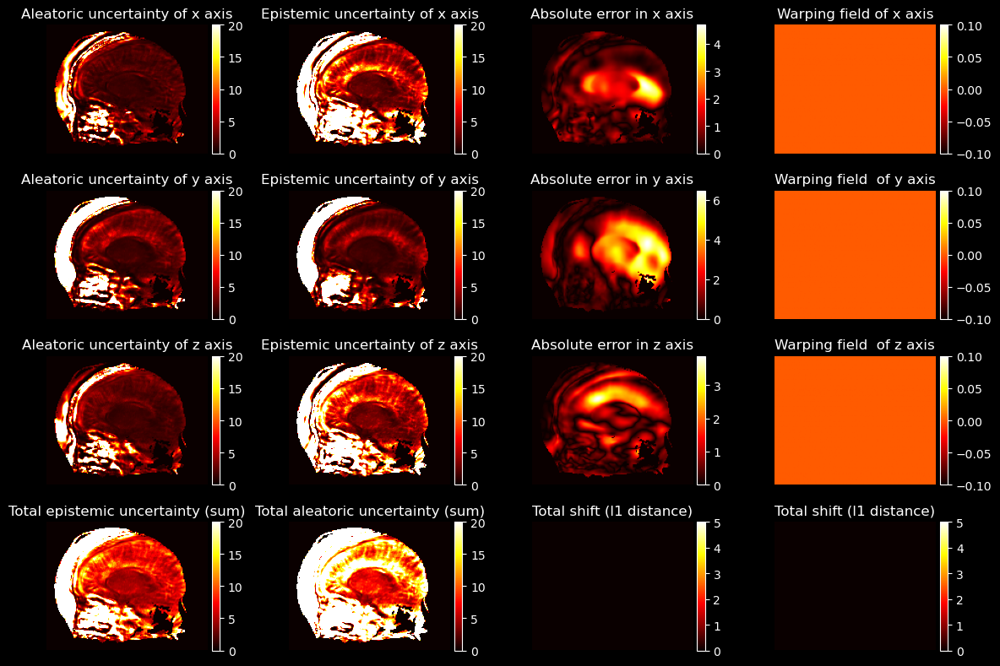

 55%|█████▌    | 11/20 [02:07<01:43, 11.55s/it]

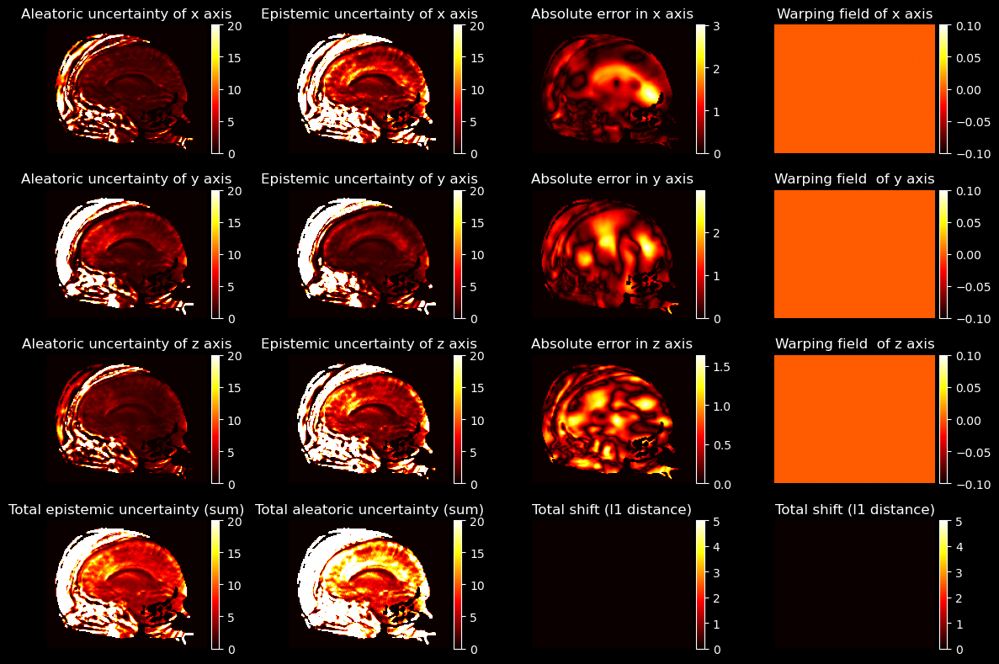

 60%|██████    | 12/20 [02:18<01:31, 11.48s/it]

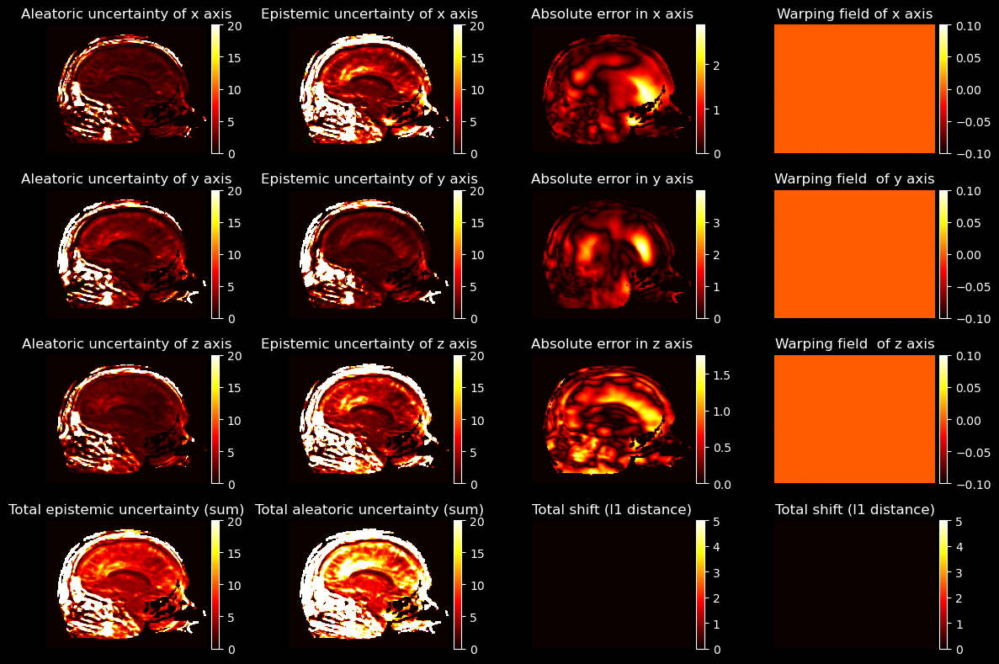

 65%|██████▌   | 13/20 [02:30<01:20, 11.49s/it]

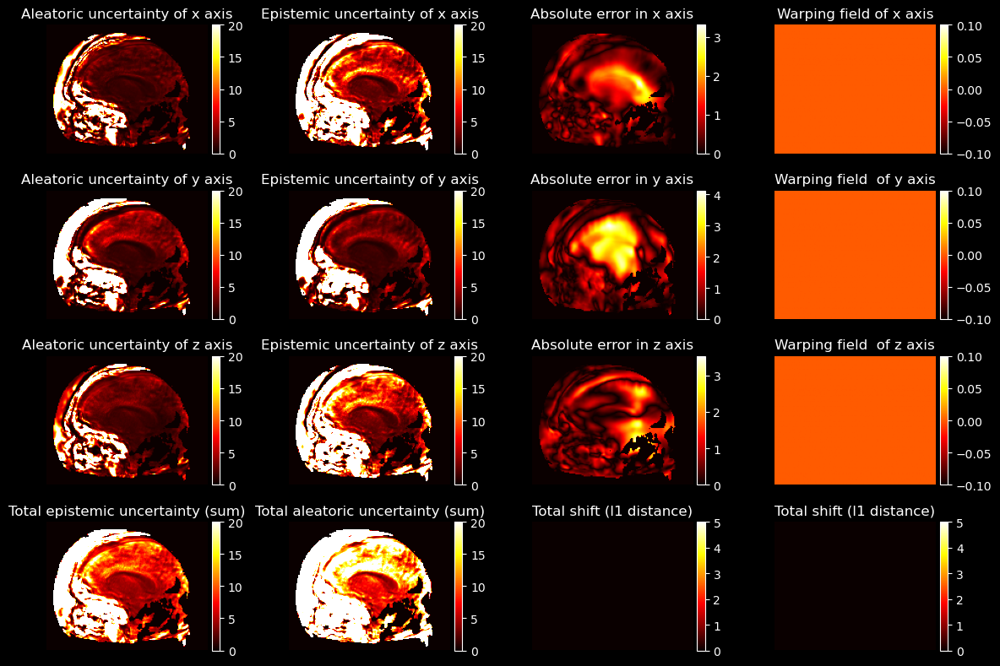

 70%|███████   | 14/20 [02:41<01:07, 11.31s/it]

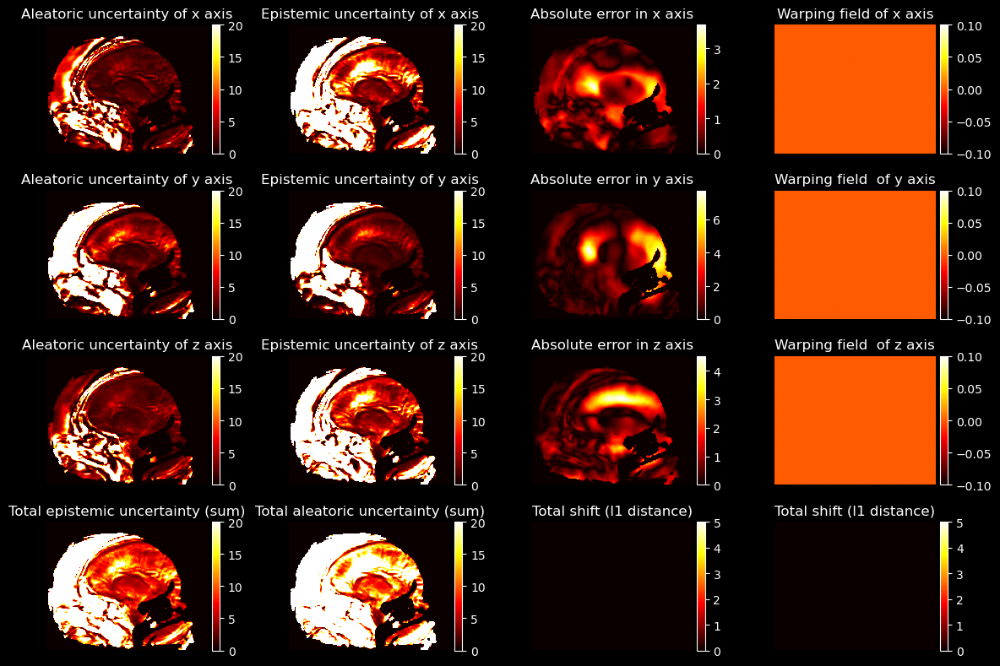

 75%|███████▌  | 15/20 [02:52<00:56, 11.29s/it]

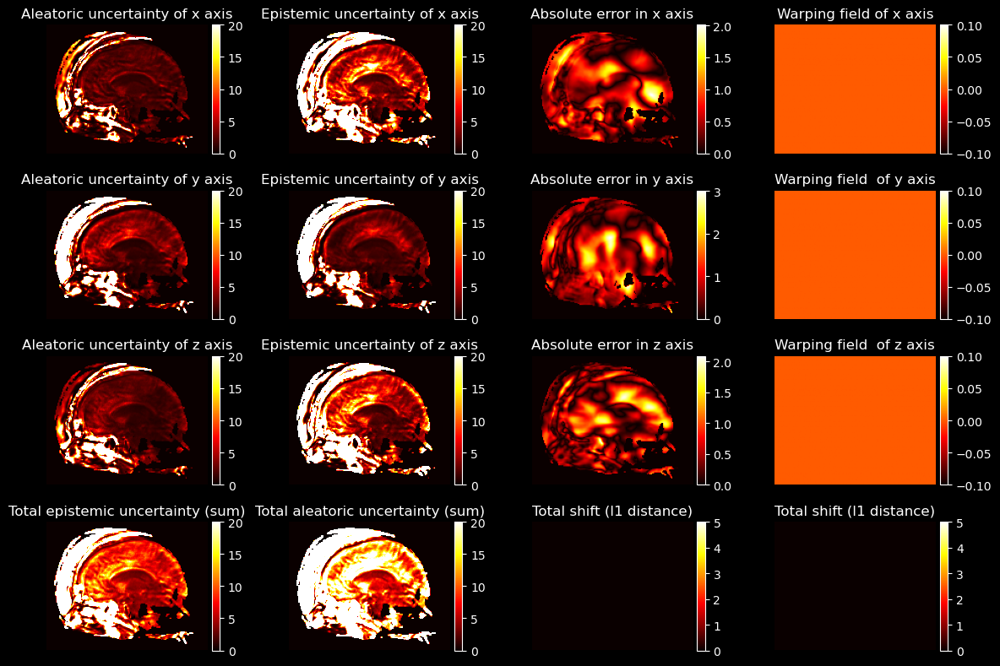

 80%|████████  | 16/20 [03:03<00:45, 11.34s/it]

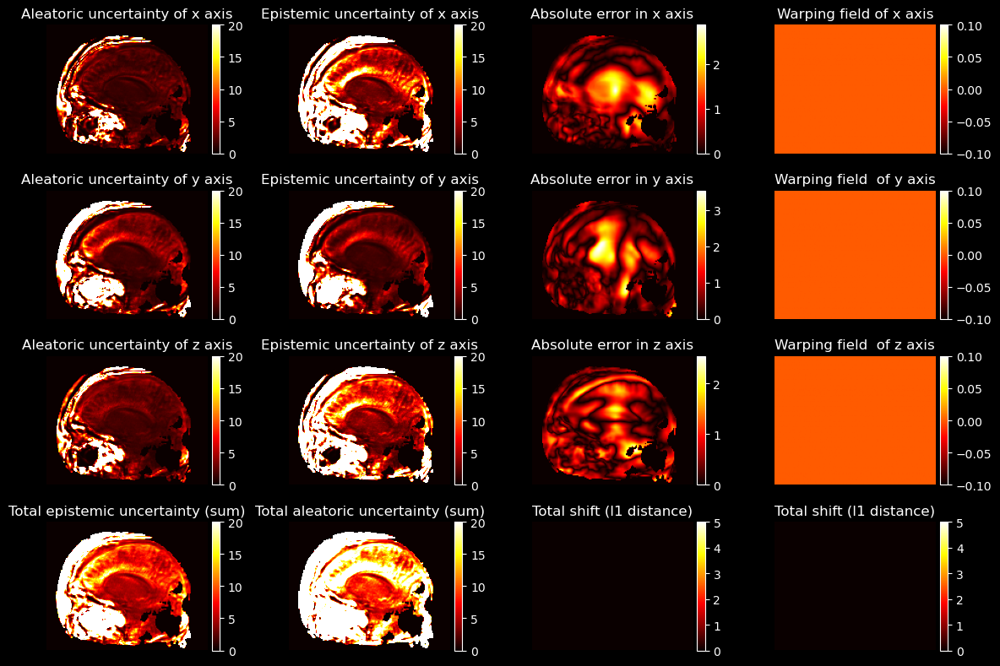

 85%|████████▌ | 17/20 [03:14<00:33, 11.25s/it]

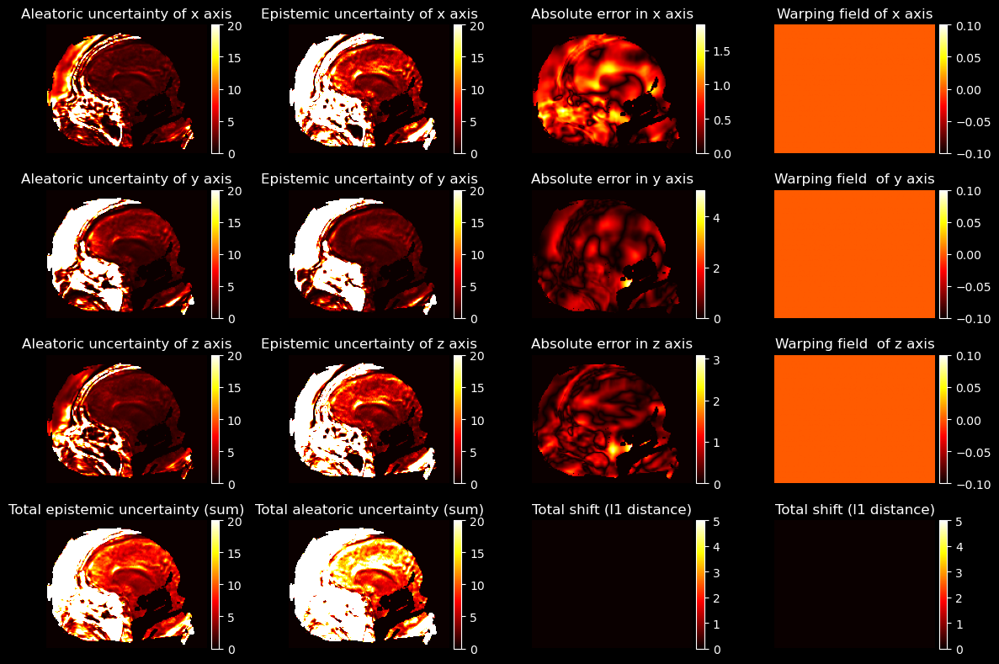

 90%|█████████ | 18/20 [03:25<00:22, 11.23s/it]

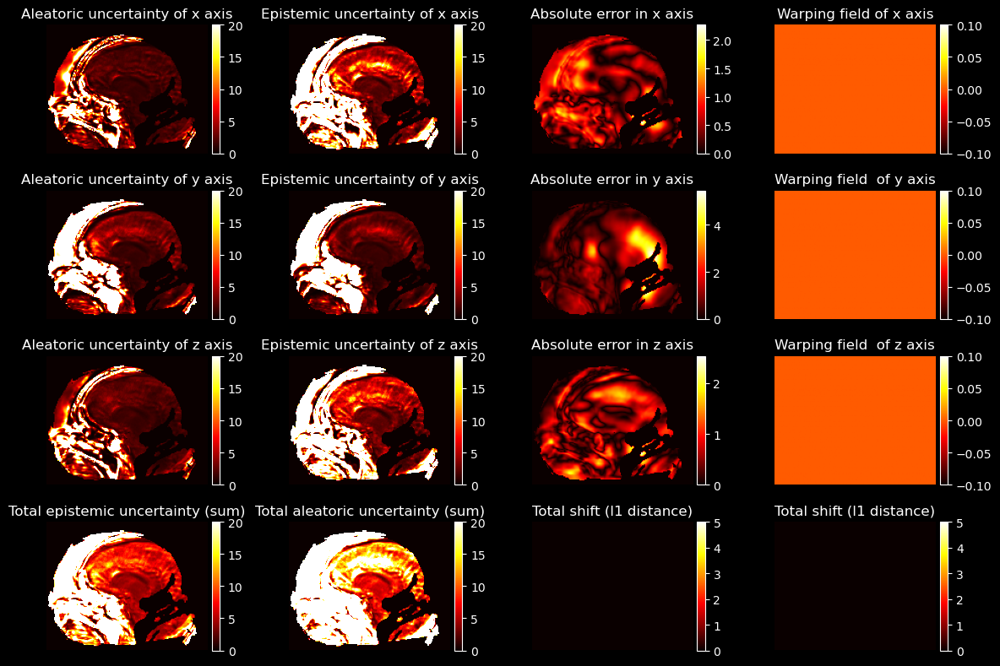

 95%|█████████▌| 19/20 [03:37<00:11, 11.39s/it]

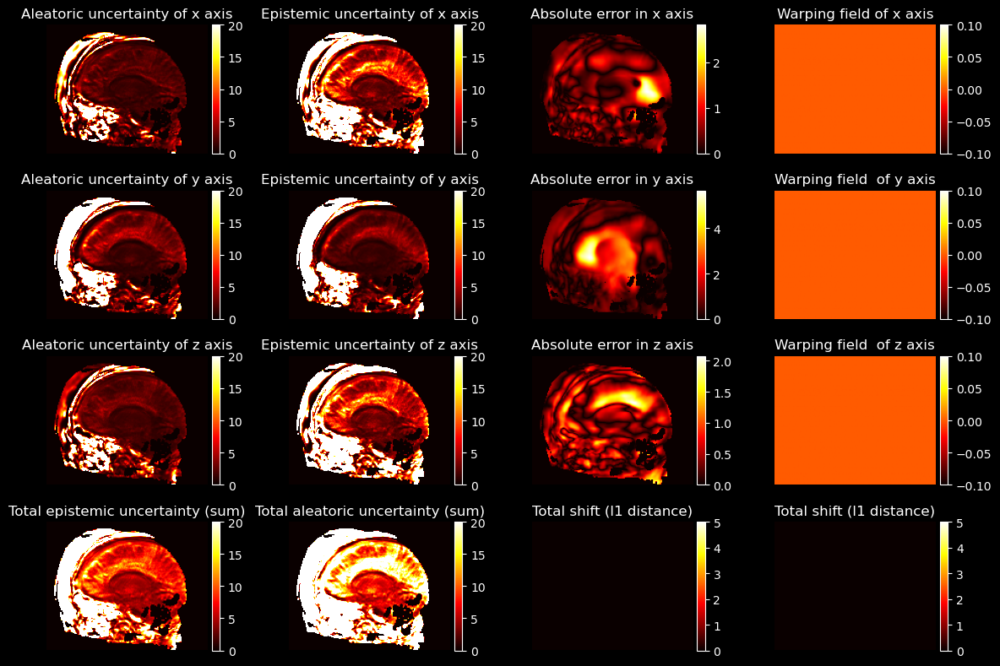

100%|██████████| 20/20 [03:48<00:00, 11.44s/it]


In [29]:
for i in tqdm(range(20)):
    data = valid_dataset[i]
    cbct_fixed = data[0].to(device).to(device)
    mr_moving = data[1].to(device).to(device)
    ct_fixed = data[2].to(device)
    ct_moving = data[3].to(device)
    gt = torch.from_numpy(data[-1]).to(device)
    with torch.no_grad():
        flows,_, _ = G(mr_moving, cbct_fixed)
        mr_reg = vxm.layers.SpatialTransformer([128,160,128], mode='bilinear').to(device)(mr_moving, flows[0])
        uncert = flows[4]
        alpha_x = uncert[0,0,:,:,:]+1
        beta_x = uncert[0,1,:,:,:]
        mu_x = uncert[0,2,:,:,:]
        alpha_y = uncert[0,3,:,:,:]+1
        beta_y = uncert[0,4,:,:,:]
        mu_y = uncert[0,5,:,:,:]
        alpha_z = uncert[0,6,:,:,:]+1
        beta_z = uncert[0,7,:,:,:]
        mu_z = uncert[0,8,:,:,:] 
    alea_x = beta_x/(alpha_x-1+1e-6)
    alea_y = beta_y/(alpha_y-1+1e-6)
    alea_z = beta_z/(alpha_z-1+1e-6)

    epi_x = beta_x/(mu_x*(alpha_x-1)+1e-6)
    epi_y = beta_y/(mu_y*(alpha_y-1)+1e-6)
    epi_z = beta_z/(mu_z*(alpha_z-1)+1e-6)

    #max_alea = np.percentile(np.concatenate((alea_x,alea_y,alea_z)),99)
    #max_epi = np.percentile(np.concatenate((epi_x,epi_y,epi_z)),99)
    plt.style.use('dark_background')
    islice = 72
    mask_head = np.flipud((cbct_fixed[0,0,islice,:,:].cpu().numpy()>0.05).astype(int))
    fig, ax = plt.subplots(4,4,figsize=(12,8))
    np.vectorize(lambda ax: ax.axis('off'))(ax)

    alx = np.flipud((alea_x.cpu().numpy()[islice,:,:]*mask_head).T)
    aly = np.flipud((alea_y.cpu().numpy()[islice,:,:]*mask_head).T)
    alz = np.flipud((alea_z.cpu().numpy()[islice,:,:]*mask_head).T)
    
    ex = np.flipud((epi_x.cpu().numpy()[islice,:,:]*mask_head).T)
    ey = np.flipud((epi_y.cpu().numpy()[islice,:,:]*mask_head).T)
    ez = np.flipud((epi_z.cpu().numpy()[islice,:,:]*mask_head).T)
    
    imx1 = ax[0][0].imshow(alx, cmap='hot', vmin=0,vmax = 20)
    divider = make_axes_locatable(ax[0][0])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imx1, cax=cax, orientation='vertical')
    ax[0][0].set_title('Aleatoric uncertainty of x axis')
    imy1 = ax[1][0].imshow(aly, cmap='hot', vmin=0,vmax = 20)
    divider = make_axes_locatable(ax[1][0])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imy1, cax=cax, orientation='vertical')
    ax[1][0].set_title('Aleatoric uncertainty of y axis')

    imz1 = ax[2][0].imshow(alz, cmap='hot', vmin=0,vmax = 20)
    divider = make_axes_locatable(ax[2][0])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imz1, cax=cax, orientation='vertical')
    ax[2][0].set_title('Aleatoric uncertainty of z axis')

    imx2 = ax[0][1].imshow(ex, cmap='hot', vmin=0,vmax = 20)
    divider = make_axes_locatable(ax[0][1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imx2, cax=cax, orientation='vertical')
    ax[0][1].set_title('Epistemic uncertainty of x axis')
    imy2 = ax[1][1].imshow(ey, cmap='hot', vmin=0,vmax = 20)
    divider = make_axes_locatable(ax[1][1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imy2, cax=cax, orientation='vertical')

    ax[1][1].set_title('Epistemic uncertainty of y axis')
    imz2 = ax[2][1].imshow(ez, cmap='hot', vmin=0,vmax = 20)
    divider = make_axes_locatable(ax[2][1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imz2, cax=cax, orientation='vertical')
    ax[2][1].set_title('Epistemic uncertainty of z axis')
    
    imta =  ax[3][0].imshow(alx+aly+alz, cmap='hot', vmin=0,vmax = 20)
    divider = make_axes_locatable(ax[3][0])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imta, cax=cax, orientation='vertical')
    ax[3][0].set_title('Total epistemic uncertainty (sum)')
    imte =  ax[3][1].imshow(ex+ey+ez, cmap='hot', vmin=0,vmax = 20)
    divider = make_axes_locatable(ax[3][1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imte, cax=cax, orientation='vertical')
    ax[3][1].set_title('Total aleatoric uncertainty (sum)')
        
    imx2 = ax[0][2].imshow(np.flipud(abs(((flows[0][0,0,islice,:,:]+gt[0,0,islice,:,:])*mask_head)).T), cmap='hot')
    divider = make_axes_locatable(ax[0][2])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imx2, cax=cax, orientation='vertical')
    ax[0][2].set_title('Absolute error in x axis')
    imy2 = ax[1][2].imshow(np.flipud(abs(((flows[0][0,1,islice,:,:]+gt[0,1,islice,:,:])*mask_head)).T), cmap='hot')
    divider = make_axes_locatable(ax[1][2])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imy2, cax=cax, orientation='vertical')
    ax[1][2].set_title('Absolute error in y axis')
    imz2 = ax[2][2].imshow(np.flipud(abs(((flows[0][0,2,islice,:,:]+gt[0,2,islice,:,:])*mask_head)).T), cmap='hot')
    divider = make_axes_locatable(ax[2][2])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imz2, cax=cax, orientation='vertical')
    ax[2][2].set_title('Absolute error in z axis')
    imz2 = ax[3][2].imshow(((var[i][0,0,islice,:,:]+var[i][0,1,islice,:,:]+var[i][0,2,islice,:,:])*mask_head).T, cmap='hot', vmin=0, vmax = 5)
    divider = make_axes_locatable(ax[3][2])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imz2, cax=cax, orientation='vertical')
    ax[3][2].set_title('Total shift (l1 distance)')
    
    imx2 = ax[0][3].imshow(((var[i][0,0,islice,:,:]*mask_head).T), cmap='hot', vmin=0)
    divider = make_axes_locatable(ax[0][3])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imx2, cax=cax, orientation='vertical')
    ax[0][3].set_title('Warping field of x axis')
    imy2 = ax[1][3].imshow(((var[i][0,1,islice,:,:]*mask_head).T), cmap='hot', vmin=0)
    divider = make_axes_locatable(ax[1][3])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imy2, cax=cax, orientation='vertical')
    ax[1][3].set_title('Warping field  of y axis')
    imz2 = ax[2][3].imshow(((var[i][0,2,islice,:,:]*mask_head).T), cmap='hot', vmin=0)
    divider = make_axes_locatable(ax[2][3])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imz2, cax=cax, orientation='vertical')
    ax[2][3].set_title('Warping field  of z axis')
    imz2 = ax[3][3].imshow(((var[i][0,0,islice,:,:]+var[i][0,1,islice,:,:]+var[i][0,2,islice,:,:])*mask_head).T, cmap='hot', vmin=0, vmax = 5)
    divider = make_axes_locatable(ax[3][3])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imz2, cax=cax, orientation='vertical')
    ax[3][3].set_title('Total shift (l1 distance)')
    plt.tight_layout()
    plt.show()

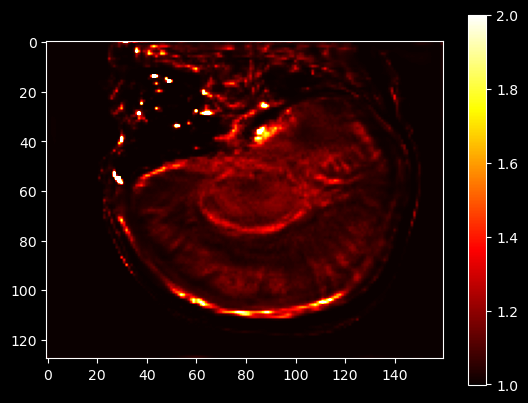

In [40]:
plt.imshow(alpha_x[72,:,:].T,cmap = 'hot',vmin = 1,vmax = 2)
plt.colorbar()

In [42]:
alpha_x.max(),beta_x.max(), mu_x.max(),alpha_x.min(),beta_x.min(), mu_x.min()

(tensor(15.4545),
 tensor(1197.0865),
 tensor(881.5322),
 tensor(1.0019),
 tensor(4.8459e-10),
 tensor(1.3766e-06))

10


ValueError: The parameter `image` must be a 2-dimensional array

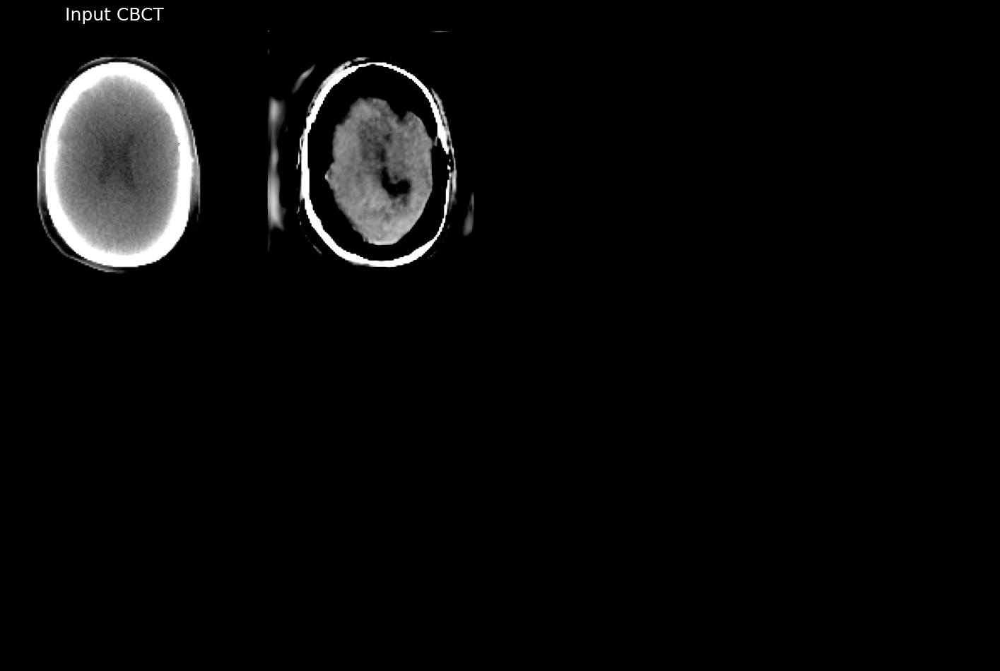

In [25]:
metrics = pd.DataFrame()
mask_val = [1,2,23,5,19,29,8]
# valid_dataset = RadOncTrainingDataset("/home/myi16/jsr_Y/new_val", num_samples=10, transform=False,
#                                           supervision=True, return_segmentation=True)
print(len(valid_dataset))
for ep in range(1):
    G.load_state_dict(checkpoint['G_state_dict'])
    dice_before_total = []
    dice_after_total = []
    hd_before_total = []
    sd_before_total = []
    hd_after_total = []
    sd_after_total = []
    tre_before_total = []
    tre_after_total = []
    
    for i in range(10):
        cbct_fixed, mr_moving, ct_fixed, ct_moving, seg_fixed, seg_moving,flow = valid_dataset[i]
        cbct_fixed = cbct_fixed.float().to(device)
        mr_moving = mr_moving.float().to(device)
        ct_fixed = ct_fixed.float().to(device)
        ct_moving = ct_moving.float().to(device)
        seg_fixed = seg_fixed.float().to(device)
        seg_moving = seg_moving.float().to(device)
        
        # cbct_fixed = torch.from_numpy(cbct_fixed).to(device).unsqueeze(0).unsqueeze(0).to(device)
        # mr_moving = torch.from_numpy(mr_moving).to(device).unsqueeze(0).unsqueeze(0).to(device)
        # ct_fixed = torch.from_numpy(ct_fixed).to(device)
        # ct_moving = torch.from_numpy(ct_moving).to(device)
        # seg_fixed =  torch.from_numpy(seg_fixed).float().unsqueeze(0).to(device)
        # seg_moving =  torch.from_numpy(seg_moving).float().unsqueeze(0).to(device)
        
        # print(cbct_fixed.shape, mr_moving.shape, ct_fixed.shape, ct_moving.shape, seg_fixed.shape, seg_moving.shape)
        # torch.Size([1, 1, 128, 160, 128]) torch.Size([1, 1, 128, 160, 128]) torch.Size([128, 160, 128]) torch.Size([128, 160, 128]) torch.Size([1, 7, 128, 160, 128]) torch.Size([1, 7, 128, 160, 128])
        with torch.no_grad():
            flow, ct_moving_synth, ct_fixed_synth = G(mr_moving, cbct_fixed)

            # the flow[0] means the final highest resolution from the cascade network.
            mr_reg = vxm.layers.SpatialTransformer([128,160,128], mode='bilinear').to(device)(mr_moving, flow[0])
            ct_reg_synth = vxm.layers.SpatialTransformer([128,160,128], mode='bilinear').to(device)(ct_moving_synth[0], flow[0])
            seg_reg = vxm.layers.SpatialTransformer([128,160,128], mode='nearest').to(device)(seg_moving, flow[0])

            dice_before = []
            hd_before = []
            sd_before = []
            dice_after= []
            hd_after = []
            sd_after = []
            for j, val in enumerate(mask_val):
                mask_fixed = seg_fixed[:,j:j+1,:,:,:]
                mask_moving = seg_moving[:,j:j+1,:,:,:]
                mask_registered = seg_reg[:,j:j+1,:,:,:]
                dice_before.append(-losses.Dice().loss(mask_fixed,mask_moving).item())
                dice_after.append(-losses.Dice().loss(mask_fixed,mask_registered).item())
                metrics_before = compute_surface_metrics(np.squeeze(mask_fixed.squeeze().cpu().numpy())==1, np.squeeze(mask_moving.squeeze().cpu().numpy())==1)
                metrics_after = compute_surface_metrics(np.squeeze(mask_fixed.squeeze().cpu().numpy())==1, np.squeeze(mask_registered.squeeze().cpu().numpy())==1)
                hd_before.append(metrics_before['hd'])
                hd_after.append(metrics_after['hd'])
                sd_before.append(metrics_before['avg_dist'])
                sd_after.append(metrics_after['avg_dist'])
                
            valid_ds = np.load(glob.glob(os.path.join("/mnt/blackhole-data2/RadOnc_Brain/Validation",'*.npz'))[i])
            seg_fixed = valid_ds['ventricle_fixed']
            seg_moving = valid_ds['ventricle_moving']
            seg_fixed = torch.from_numpy(resize(seg_fixed, [128,160,128], order=0, anti_aliasing=False)).unsqueeze(0).unsqueeze(0).to(device)
            seg_moving = torch.from_numpy(resize(seg_moving, [128,160,128], order=0, anti_aliasing=False)).unsqueeze(0).unsqueeze(0).to(device)
            seg_reg = vxm.layers.SpatialTransformer([128,160,128], mode='nearest').to(device)(seg_moving, flow[0])
            tre_before_total.append(compute_TRE(seg_fixed.squeeze().cpu().numpy(), seg_moving.squeeze().cpu().numpy(), [1,1,1]).mean())
            tre_after_total.append(compute_TRE(seg_fixed.squeeze().cpu().numpy(), seg_reg.squeeze().cpu().numpy(), [1,1,1]).mean())
            dice_before_total.append(dice_before)
            dice_after_total.append(dice_after)
            hd_before_total.append(hd_before)
            hd_after_total.append(hd_after)
            sd_before_total.append(sd_before)
            sd_after_total.append(sd_after)
            
            islice = 72
            fig, ax = plt.subplots(2,4,figsize=(18,12))
            np.vectorize(lambda ax: ax.axis('off'))(ax)
            ax[0,0].imshow(cbct_fixed.cpu().numpy()[0,0,:,:,islice].T, cmap='gray')
            ax[0,0].set_title('Input CBCT',fontdict={'fontsize': 18})
            
            ax[0,1].imshow(ct_fixed_synth[0].cpu().numpy()[0,0,:,:,islice].T, cmap='gray', vmin=0.4, vmax=0.95)
            ax[0,1].imshow(canny(ct_fixed.cpu().numpy()[:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            ax[0,1].set_title('CT syhthesis from CBCT',fontdict={'fontsize': 18})
            
            ax[0,2].imshow(ct_fixed.cpu().numpy()[:,:,islice].T, cmap='gray', vmin=0.4, vmax=0.95)
            ax[0,2].imshow(canny(ct_fixed.cpu().numpy()[:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            ax[0,2].set_title('Input CT',fontdict={'fontsize': 18})
            
            ax[0,3].imshow(ct_reg_synth.cpu().numpy()[0,0,:,:,islice].T, cmap='gray', vmin=0.4, vmax=0.95)
            ax[0,3].imshow(canny(ct_fixed.cpu().numpy()[:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            ax[0,3].set_title('Deformed CT syhthesis from CBCT',fontdict={'fontsize': 18})

            ax[1,0].imshow(mr_moving.cpu().numpy()[0,0,:,:,islice].T, cmap='gray')
            ax[1,0].imshow(canny(ct_fixed.cpu().numpy()[:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            ax[1,0].set_title('Input MRI',fontdict={'fontsize': 18})
            
            ax[1,1].imshow(ct_moving_synth[0].cpu().numpy()[0,0,:,:,islice].T, cmap='gray', vmin=0.4, vmax=0.95)
            ax[1,1].imshow(canny(ct_fixed.cpu().numpy()[:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            ax[1,1].set_title('CT syhthesis from MRI',fontdict={'fontsize': 18})
            
            ax[1,2].imshow(ct_moving.cpu().numpy()[:,:,islice].T, cmap='gray', vmin=0.4, vmax=0.95)
            ax[1,2].imshow(canny(ct_fixed.cpu().numpy()[:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            ax[1,2].set_title('CT syhthesis from MRI',fontdict={'fontsize': 18})
            
            ax[1,3].imshow(mr_reg.cpu().numpy()[0,0,:,:,islice].T, cmap='gray')
            ax[1,3].imshow(canny(ct_fixed.cpu().numpy()[:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            ax[1,3].set_title('Deformed MRI',fontdict={'fontsize': 18})
            
            plt.tight_layout()
            plt.show()
            # fig, ax = plt.subplots(2,4,figsize=(18,12))
            # np.vectorize(lambda ax: ax.axis('off'))(ax)
            # ax[0,0].imshow(np.flip(cbct_fixed.cpu().numpy()[0,0,islice,:,:].T), cmap='gray')
            # ax[0,0].set_title('Input CBCT',fontdict={'fontsize': 18})
            
            # ax[0,1].imshow(np.flip(ct_fixed_synth[0].cpu().numpy()[0,0,islice,:,:].T), cmap='gray', vmin=0.4, vmax=0.95)
            # ax[0,1].imshow(canny(np.flip(ct_fixed.cpu().numpy()[islice,:,:].T), sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            # ax[0,1].set_title('CT syhthesis from CBCT',fontdict={'fontsize': 18})
            
            # ax[0,2].imshow(np.flip(ct_fixed.cpu().numpy()[islice,:,:].T), cmap='gray', vmin=0.4, vmax=0.95)
            # ax[0,2].imshow(canny(np.flip(ct_fixed.cpu().numpy()[islice,:,:].T), sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            # ax[0,2].set_title('Input CT',fontdict={'fontsize': 18})
            
            # ax[0,3].imshow(np.flip(ct_reg_synth.cpu().numpy()[0,0,islice,:,:].T), cmap='gray', vmin=0.4, vmax=0.95)
            # ax[0,3].imshow(canny(np.flip(ct_fixed.cpu().numpy()[islice,:,:].T), sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            # ax[0,3].set_title('Deformed CT syhthesis from CBCT',fontdict={'fontsize': 18})

            # ax[1,0].imshow(np.flip(mr_moving.cpu().numpy()[0,0,islice,:,:].T), cmap='gray')
            # ax[1,0].imshow(canny(np.flip(ct_fixed.cpu().numpy()[islice,:,:].T), sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            # ax[1,0].set_title('Input MRI',fontdict={'fontsize': 18})
            
            # ax[1,1].imshow(np.flip(ct_moving_synth[0].cpu().numpy()[0,0,islice,:,:].T), cmap='gray', vmin=0.4, vmax=0.95)
            # ax[1,1].imshow(canny(np.flip(ct_fixed.cpu().numpy()[islice,:,:].T), sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            # ax[1,1].set_title('CT syhthesis from MRI',fontdict={'fontsize': 18})
            
            # ax[1,2].imshow(np.flip(ct_moving.cpu().numpy()[islice,:,:].T), cmap='gray', vmin=0.4, vmax=0.95)
            # ax[1,2].imshow(canny(np.flip(ct_fixed.cpu().numpy()[islice,:,:].T), sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            # ax[1,2].set_title('Input deformed CT',fontdict={'fontsize': 18})
            
            # ax[1,3].imshow(np.flip(mr_reg.cpu().numpy()[0,0,islice,:,:].T), cmap='gray')
            # ax[1,3].imshow(canny(np.flip(ct_fixed.cpu().numpy()[islice,:,:].T), sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            # ax[1,3].set_title('Deformed MRI',fontdict={'fontsize': 18})
            
            # plt.tight_layout()
            # plt.show()
           
    if ep == 0:
        d0 = {'Dice':np.reshape(np.array(dice_before_total),-1), 'HD':np.reshape(np.array(hd_before_total),-1), 'SD':np.reshape(np.array(sd_before_total),-1), 
              'anatomy':['3rd Ventricle', '4th Ventricle','Lateral Ventricles', 'Amygdala', 'Hippocampus', 'Thalamus', 'Caudate']*10, 'ep':[0]*70, 'method':['Rigid']*70}
        d0 = pd.DataFrame(data=d0)
        metrics = pd.concat([metrics, d0])

    d = {'Dice':np.reshape(np.array(dice_after_total),-1), 'HD':np.reshape(np.array(hd_after_total),-1), 'SD':np.reshape(np.array(sd_after_total),-1), 
         'anatomy':['3rd Ventricle', '4th Ventricle','Lateral Ventricles', 'Amygdala', 'Hippocampus', 'Thalamus', 'Caudate']*10, 'ep':[29+ep*10]*70, 'method':['JSR-Cascade']*70}
    d = pd.DataFrame(data=d)
    metrics = pd.concat([metrics, d])

In [7]:
data = metrics[metrics['method']=='JSR-Cascade']
V3 = data[data['anatomy']=='3rd Ventricle']
V4 = data[data['anatomy']=='4th Ventricle']
VL = data[data['anatomy']=='Lateral Ventricle']
Am = data[data['anatomy']=='Amygdala']
Hippo = data[data['anatomy']=='Hippocampus']
Thala = data[data['anatomy']=='Thalamus']
Cau = data[data['anatomy']=='Caudate']

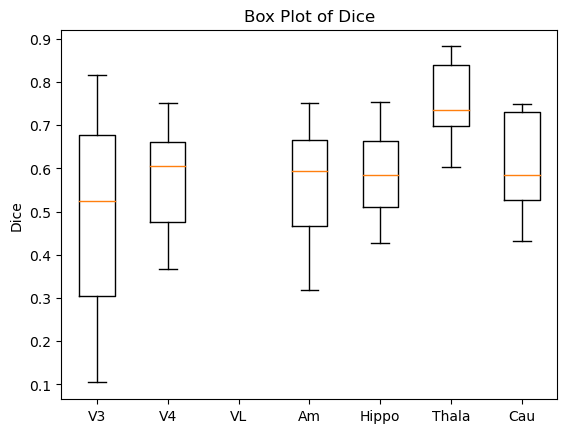

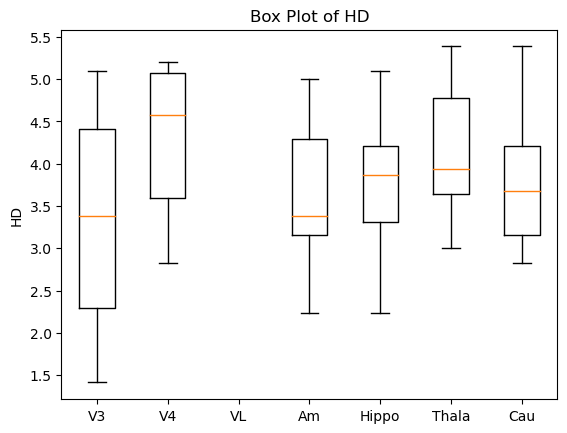

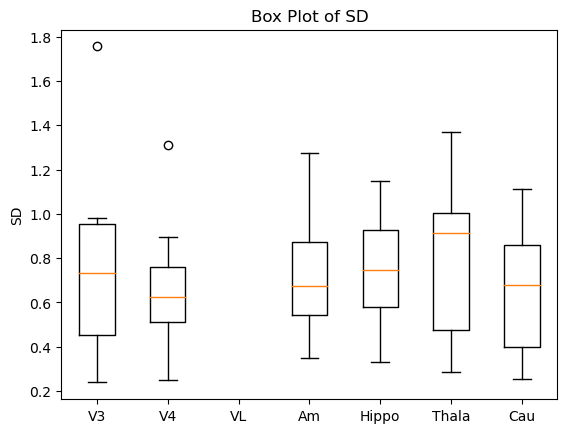

In [11]:
dataframes = [V3, V4, VL, Am, Hippo, Thala, Cau]
names = ['V3', 'V4', 'VL', 'Am', 'Hippo', 'Thala', 'Cau']

# Create a list of metric names
metrics = ['Dice', 'HD', 'SD']
# Create a box plot for each metric
plt.style.use('default')
for metric in metrics:
    data = [df[metric] for df in dataframes]
    plt.boxplot(data, labels=[names[i] for i in range(len(dataframes))])
    plt.title(f'Box Plot of {metric}')
    plt.ylabel(metric)
    plt.show()

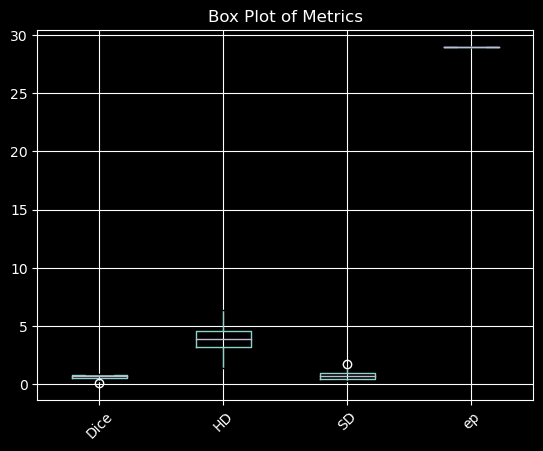

In [16]:
data.boxplot()
plt.style.use('default')
# Set the title and labels
plt.title('Box Plot of Metrics')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility

# Show the plot
plt.show()

In [13]:
sum_dice = 0
sum_hd = 0
sum_sd = 0
for name in ['3rd Ventricle', '4th Ventricle','Lateral Ventricles', 'Amygdala', 'Hippocampus', 'Thalamus', 'Caudate']:
    data = metrics[metrics['anatomy']==name]
    data = data[data['method']=='JSR-Cascade']
    sum_dice += data['Dice'].mean()
    sum_hd += data['HD'].mean()
    sum_sd += data['SD'].mean()
    Dice = data['Dice'].mean()
    
    HD = data['HD'].mean()
    SD = data['SD'].mean()
    print(name, Dice, HD, SD)

3rd Ventricle 0.17651463598012923 inf 1.4527832005868404
4th Ventricle 0.29744336046278474 4.217020469969781 1.015211675414505
Lateral Ventricles 0.5042198151350021 5.2038848142458445 1.074261980133741
Amygdala 0.302967082336545 3.4663304093109533 0.7842559521362272
Hippocampus 0.39005717933177947 4.786277550888299 0.8758840710982121
Thalamus 0.5701994255185128 5.42592021658515 1.4309335200468605
Caudate 0.2899524986743927 5.294699298827361 1.1002017249823666


In [14]:
meand = metrics[metrics['method']=='JSR-Cascade']
meand.mean()


/tmp/ipykernel_45388/3121558659.py:2: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  meand.mean()


Dice     0.361622
HD            inf
SD       1.099747
ep      29.000000
dtype: float64

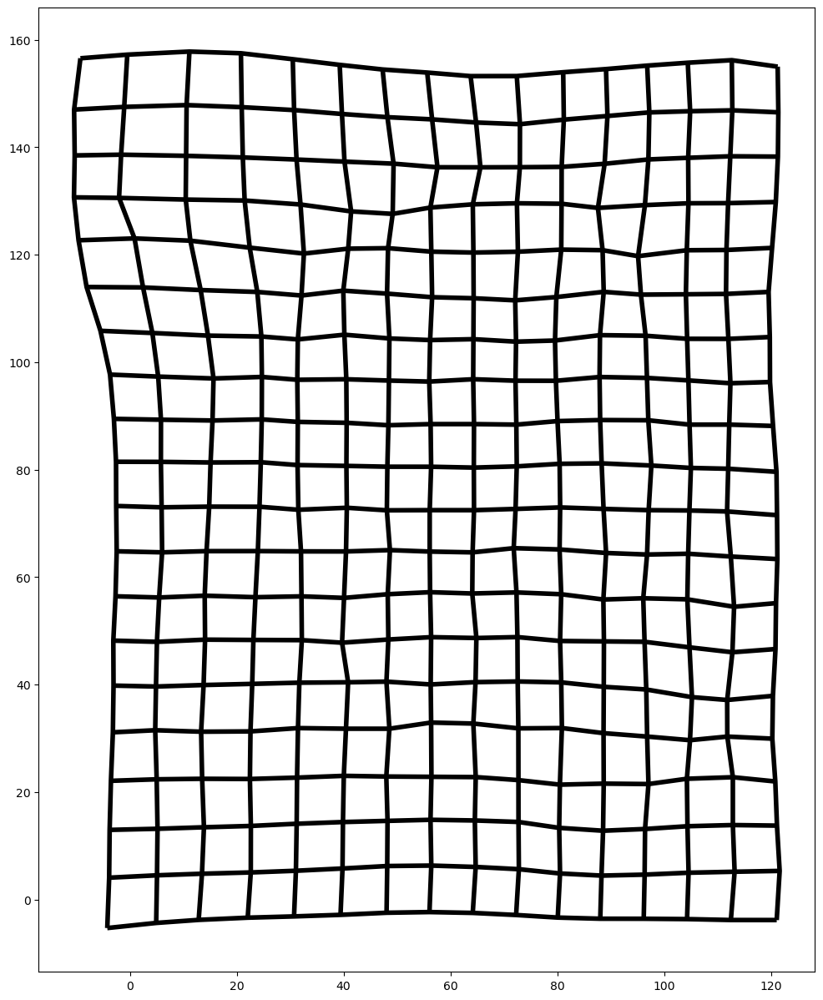

In [14]:
plt.style.use('default')
def plot_flow(flow, z, spacing=8, ax=None):
    def plot_grid(x,y, ax=ax, **kwargs):
        ax = ax or plt.gca()
        segs1 = np.stack((x,y), axis=2)
        segs2 = segs1.transpose(1,0,2)
        ax.add_collection(LineCollection(segs1, **kwargs))
        ax.add_collection(LineCollection(segs2, **kwargs))
        ax.autoscale()

    grid_x,grid_y = np.meshgrid(np.linspace(0, flow.shape[1], flow.shape[1]), np.linspace(0, flow.shape[0], flow.shape[0]))
#     plot_grid(grid_x[::spacing, ::spacing],grid_y[::spacing, ::spacing], ax=ax,  color="lightgrey")

    distx = grid_x[::spacing, ::spacing] - flow[::spacing, ::spacing, z, 1]
    disty = grid_y[::spacing, ::spacing] - flow[::spacing, ::spacing, z, 0]
    # distx, disty = f(grid_x,grid_y)
    plot_grid(disty, distx, ax=ax, color="black", linewidths=4)
    
fig, ax = plt.subplots(figsize=(12,15))
plot_flow(flow[0].squeeze().numpy().transpose((1,2,3,0)), spacing=8, z=100, ax=ax)

In [16]:
flow[0].shape

torch.Size([1, 3, 128, 160, 128])